# Tutorial for NIRCam coronagraphy reduction with spaceKLIP

In this notebook we will reduce the NIRCam coronagraphy data on HIP 65426 b 
from the JWST ERS program on Direct Observations of Exoplanetary Systems, program 1386. 



<div class="alert alert-block alert-success">
<b>Relation to other tutorials:</b> This notebook is intentionally very similar to the MIRI data reduction notebook.  Subsequent analyses steps will be carried out in the NIRCam post-pipeline analyses notebook. 
</div>

<div class="alert alert-block alert-info">
<b>NIRCam-specific information:</b> Steps and information specific to NIRCam are called out in blue.</div>

## Setup and imports

In [1]:
import os
import pdb
import sys
import glob

import numpy as np
import astropy.io.fits as fits

import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams.update({'font.size': 14})

import spaceKLIP

Note that currently the import of `webbpsf_ext` has a side effect of configuring extra verbose logging. We're not interested in that logging text, so let's quiet it. 

In [2]:
import webbpsf_ext
webbpsf_ext.setup_logging('WARN', verbose=False)

In [3]:
# name the subdirectory where we will keep the data for this tutorial

data_root = 'data_nircam_hd65426'

## Table of Contents:
* [Download tutorial data](#Precursor:-Download-the-data,-if-you-don't-already-have-it.)
* [Level 1 reductions](#Level-1-reductions)
* [Level 2 reductions](#Level-2-reductions)
* [Level 3 reductions: Preparations](#Level-3-reductions:-Preparations)
* [Level 3 reductions: KLIP](#Level-3-reductions:-KLIP)


In [4]:
# Update notebook display to use full width of the window. This is a convenience for some of the large text output tables. 
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

## Precursor: Download the data, if you don't already have it. 

If you already have a copy of this data, then you can adjust paths below. For this notebook, we assume you don't already have the data. So let's download it here. 


We can do this using the (jwst_mast_query)[https://github.com/spacetelescope/jwst_mast_query] package.  Consult that package's own documentation for more. 

We download all the uncalibrated raw data (`uncal.fits`), since we will use spaceKLIP to invoke the jwst pipeline with some customized options and extra steps optimized for coronagraphy. 

In [5]:
# make subdirectories to put these data in

if not os.path.isdir(data_root):
    
    os.makedirs(data_root)
    os.makedirs(os.path.join(data_root, 'uncal'))
    

    # invoke the download
    download_cmd = "jwst_download.py --propID 1386 -i nircam -l 700 --obsnums 1 2 3  "+\
                   "--outsubdir data_nircam_hd65426/uncal --skip_propID2outsubdir -f uncal"
    import subprocess
    subprocess.Popen(download_cmd, shell=True).wait()

# Level 1 reductions

### Index files into database for level 1

SpaceKLIP relies on a `Database` class to track observations, data files, and the relationships between them. 

We begin by creating a database, and reading files into it. 

In [10]:
# Initialize spaceKLIP database.
database = spaceKLIP.database.create_database(input_dir = os.path.join(data_root, 'uncal'),
                                   output_dir=data_root, 
                                   pid=1386)

[spaceKLIP.database:INFO] --> Identified 5 concatenation(s)
[spaceKLIP.database:INFO]   --> Concatenation 1: JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R
TYPE  EXP_TYPE DATAMODL TELESCOP  TARGPROP INSTRUME DETECTOR FILTER ...   SUBARRAY  NUMDTHPT XOFFSET YOFFSET  PIXSCALE  BUNIT      ROLL_REF      BLURFWHM
---- --------- -------- -------- --------- -------- -------- ------ ... ----------- -------- ------- ------- ---------- ----- ------------------ --------
 SCI NRC_CORON   STAGE0     JWST HIP-65426   NIRCAM NRCALONG  F250M ... SUB320A335R        1     0.0     0.0 0.06247899    DN  110.2786614838192      nan
 SCI NRC_CORON   STAGE0     JWST HIP-65426   NIRCAM NRCALONG  F250M ... SUB320A335R        1     0.0     0.0 0.06247899    DN  120.3590367370958      nan
 REF NRC_CORON   STAGE0     JWST HIP-68245   NIRCAM NRCALONG  F250M ... SUB320A335R        9     0.0     0.0 0.06247899    DN  110.0084122158856      nan
 REF NRC_CORON   STAGE0     JWST HIP-68245   NIRCAM NRCALONG  F25

TYPE  EXP_TYPE DATAMODL TELESCOP  TARGPROP INSTRUME DETECTOR FILTER ...   SUBARRAY  NUMDTHPT XOFFSET YOFFSET  PIXSCALE  BUNIT      ROLL_REF      BLURFWHM
---- --------- -------- -------- --------- -------- -------- ------ ... ----------- -------- ------- ------- ---------- ----- ------------------ --------
 SCI NRC_CORON   STAGE0     JWST HIP-65426   NIRCAM NRCALONG  F444W ... SUB320A335R        1     0.0     0.0 0.06247899    DN  110.2786558985023      nan
 SCI NRC_CORON   STAGE0     JWST HIP-65426   NIRCAM NRCALONG  F444W ... SUB320A335R        1     0.0     0.0 0.06247899    DN  120.3590194808035      nan
 REF NRC_CORON   STAGE0     JWST HIP-68245   NIRCAM NRCALONG  F444W ... SUB320A335R        9     0.0     0.0 0.06247899    DN 110.00836165914811      nan
 REF NRC_CORON   STAGE0     JWST HIP-68245   NIRCAM NRCALONG  F444W ... SUB320A335R        9     0.0     0.0 0.06247899    DN  110.0083913507891      nan
 REF NRC_CORON   STAGE0     JWST HIP-68245   NIRCAM NRCALONG  F444W ... SUB3

The above is a bit verbose and can be hard for a human to parse; let's ask the database to summarize what it contains: 

In [11]:
database.summarize()

NIRCAM_F250M_MASK335R
	STAGE0: 11 files;	2 SCI, 9 REF
NIRCAM_F300M_MASK335R
	STAGE0: 11 files;	2 SCI, 9 REF
NIRCAM_F356W_MASK335R
	STAGE0: 11 files;	2 SCI, 9 REF
NIRCAM_F410M_MASK335R
	STAGE0: 11 files;	2 SCI, 9 REF
NIRCAM_F444W_MASK335R
	STAGE0: 11 files;	2 SCI, 9 REF


### Run level 1 reductions

We use spaceKLIP to invoke the level 1 pipeline, with a handful of parameter customizations.

This will run the Detector1 pipeline for all input data, saving the output to a subdirectory named `stage1`.

In [12]:
spaceKLIP.coron1pipeline.run_obs(database=database,
                       steps={'saturation': {'n_pix_grow_sat': 1,
                                             'grow_diagonal': False},
                              'refpix': {'odd_even_columns': True,
                                         'odd_even_rows': True,
                                         'nlower': 4,
                                         'nupper': 4,
                                         'nleft': 4,
                                         'nright': 4,
                                         'nrow_off': 0,
                                         'ncol_off': 0},
                              'dark_current': {'skip': True},
                              'persistence': {'skip': True},
                              'jump': {'rejection_threshold': 4.,
                                       'three_group_rejection_threshold': 4.,
                                       'four_group_rejection_threshold': 4.,
                                       'maximum_cores': 'all'},
                              'ramp_fit': {'save_calibrated_ramp': False,
                                          'maximum_cores': 'all'}},
                       subdir='stage1')

[spaceKLIP.coron1pipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386002001_03106_00001_nrcalong_uncal.fits
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386003001_03106_00001_nrcalong_uncal.fits
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_03106_00001_nrcalong_uncal.fits
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_03106_00002_nrcalong_uncal.fits
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_03106_00003_nrcalong_uncal.fits
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_03106_00004_nrcalong_uncal.fits
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_03106_00005_nrcalong_uncal.fits
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_03106_00006_nrcalong_uncal.fits
[space

We can now examine the database, and it shows that all the available files for both filters have now been processed to Stage 1. 

(The stage 0 files are removed from the database automatically since there is nothing more to do with them, though the files remain on disk of course)

In [9]:
database.summarize()

NIRCAM_F250M_MASKA335R
	STAGE0: 11 files;	2 SCI, 9 REF
NIRCAM_F300M_MASKA335R
	STAGE0: 11 files;	2 SCI, 9 REF
NIRCAM_F356W_MASKA335R
	STAGE0: 11 files;	2 SCI, 9 REF
NIRCAM_F410M_MASKA335R
	STAGE0: 11 files;	2 SCI, 9 REF
NIRCAM_F444W_MASKA335R
	STAGE0: 11 files;	2 SCI, 9 REF


### Display the results of the level 1 reductions

For example, let's look at the data available in one filter, F444W. Each image is displayed with some annotations. The pixels masked out as DO_NOT_USE in the data quality extension are masked out in orange. 

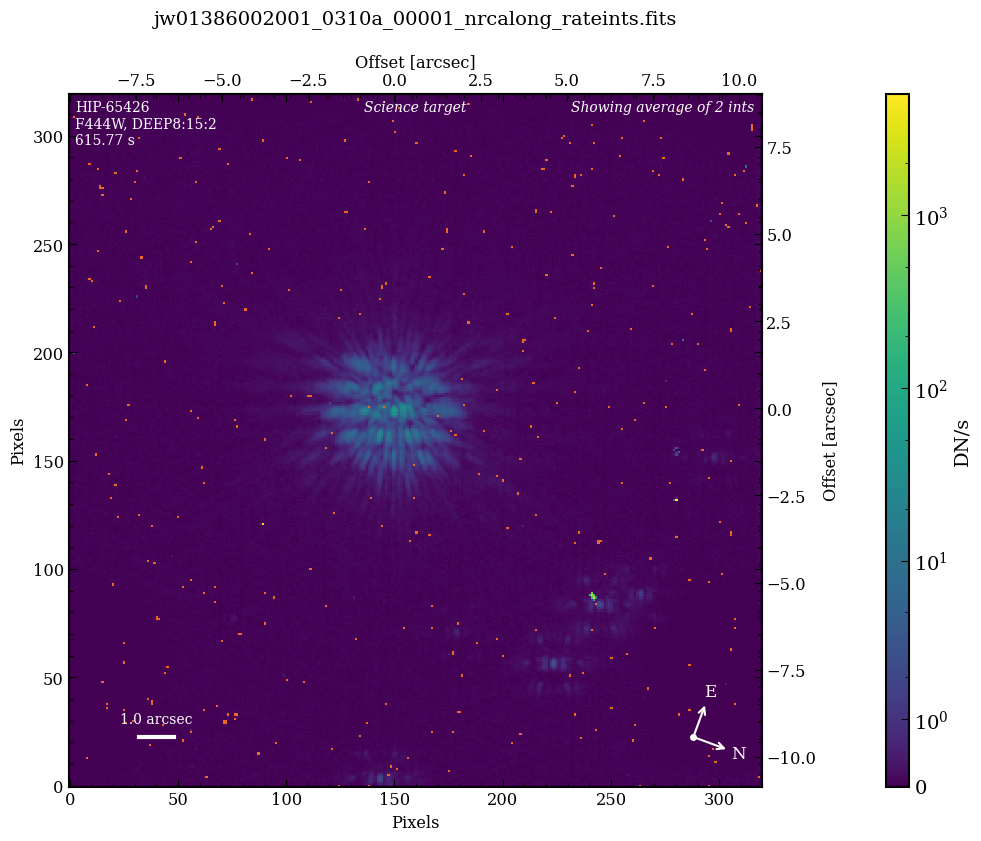

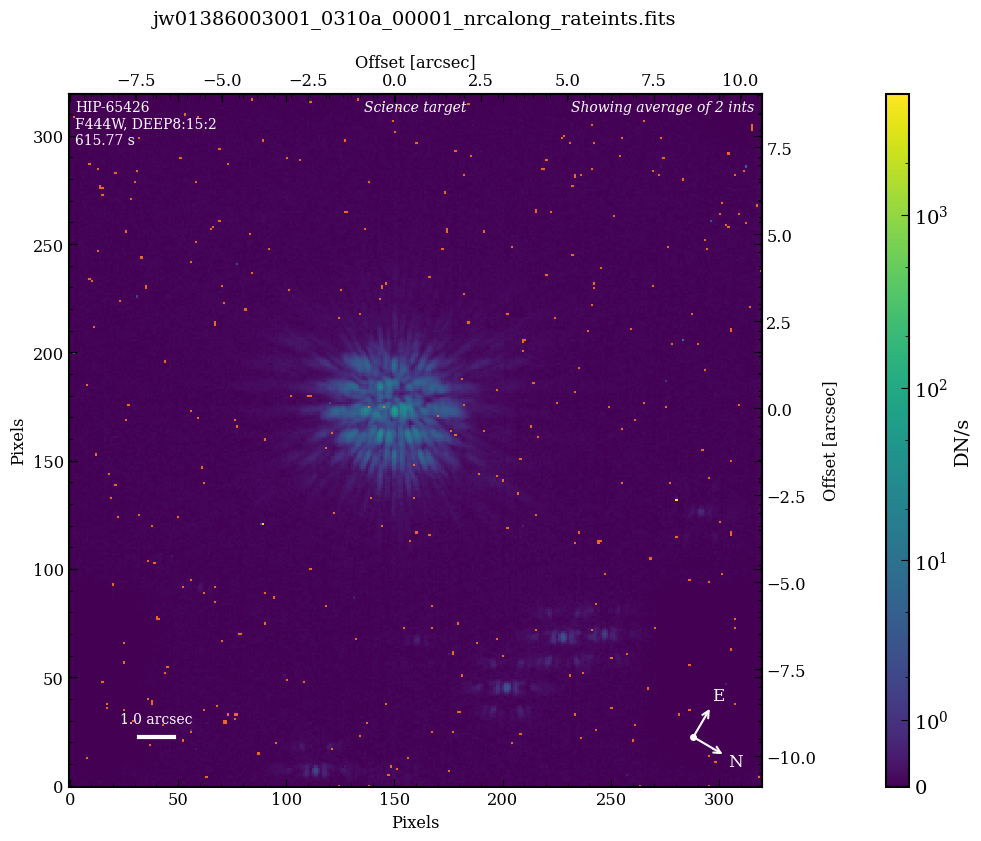

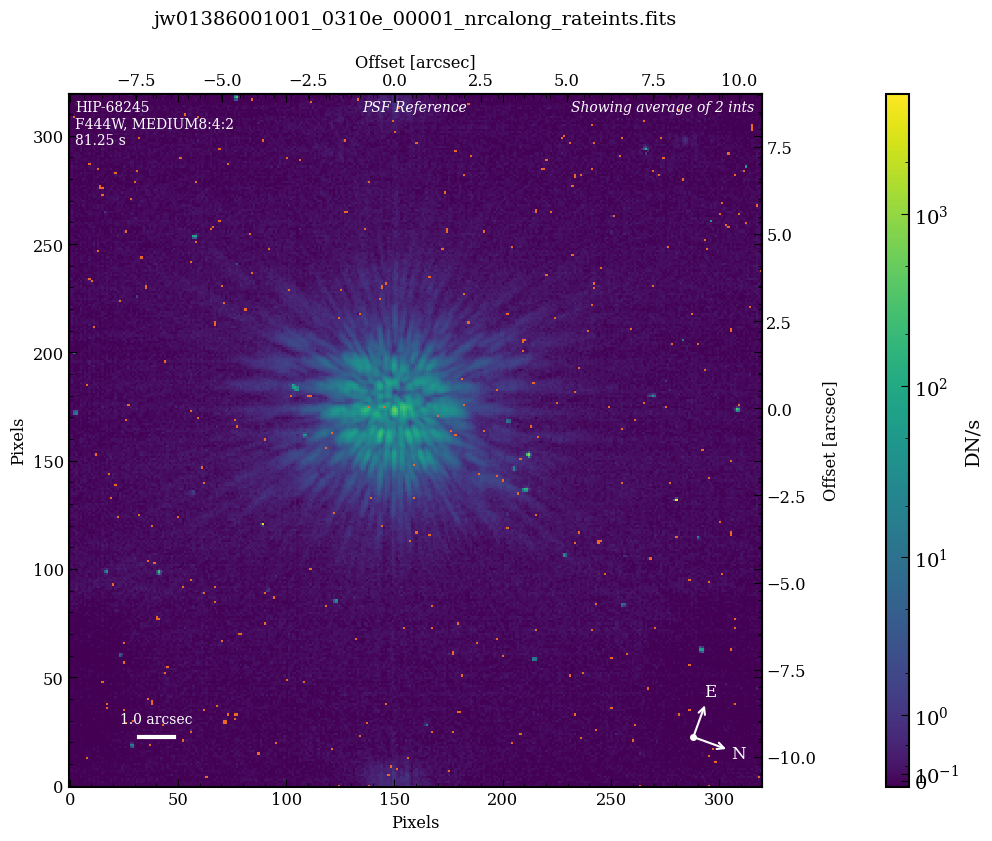

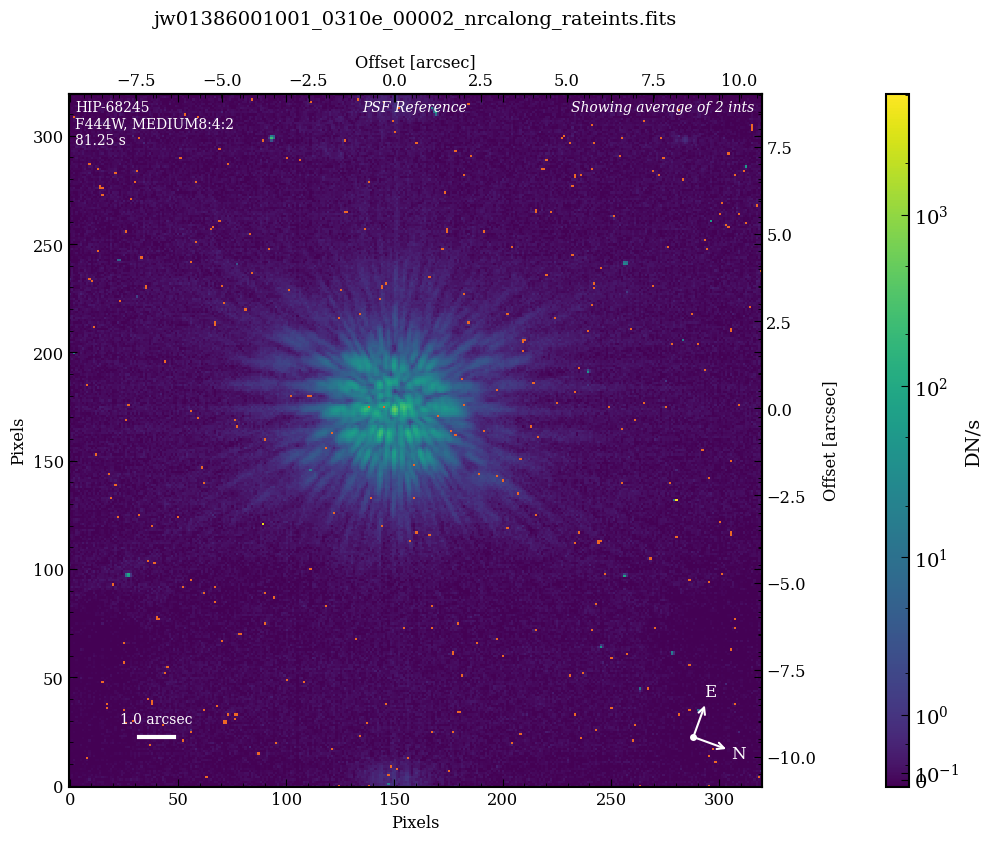

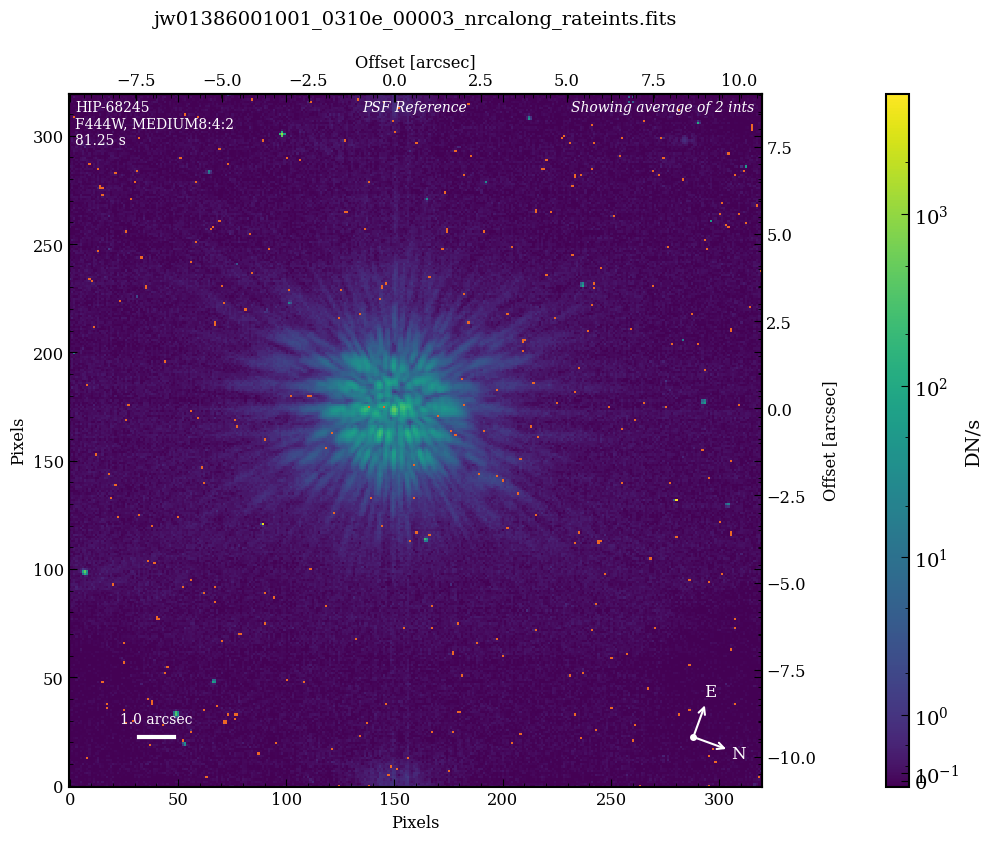

...

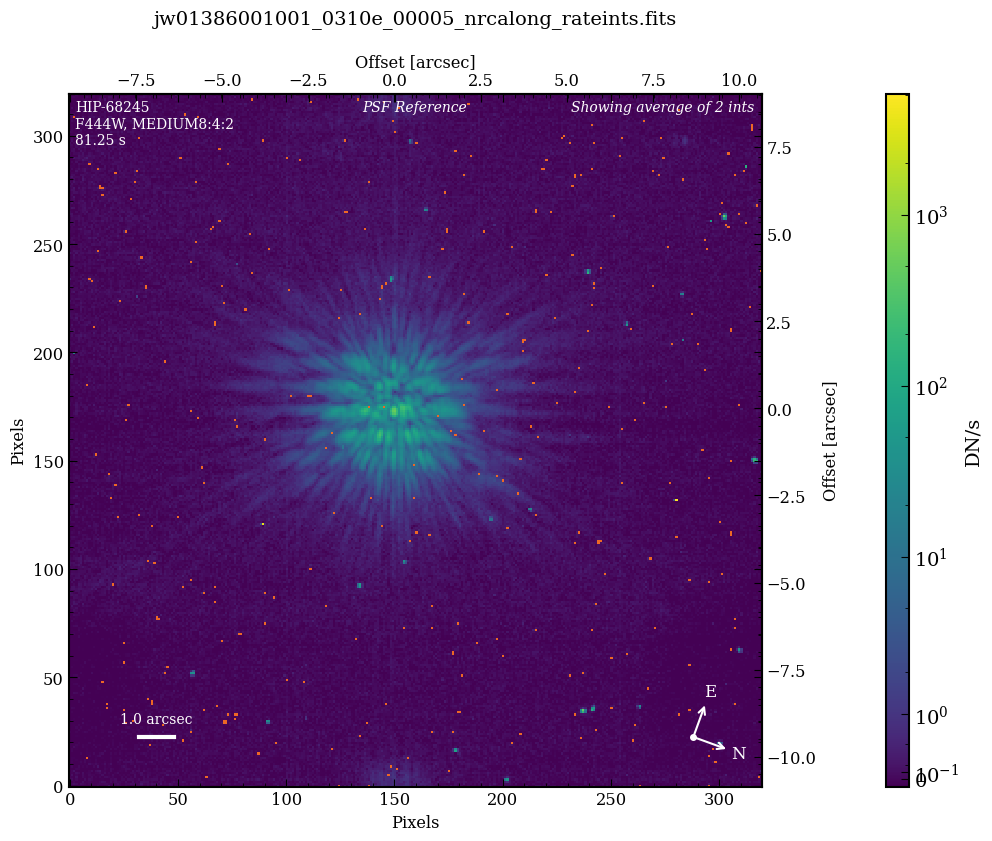

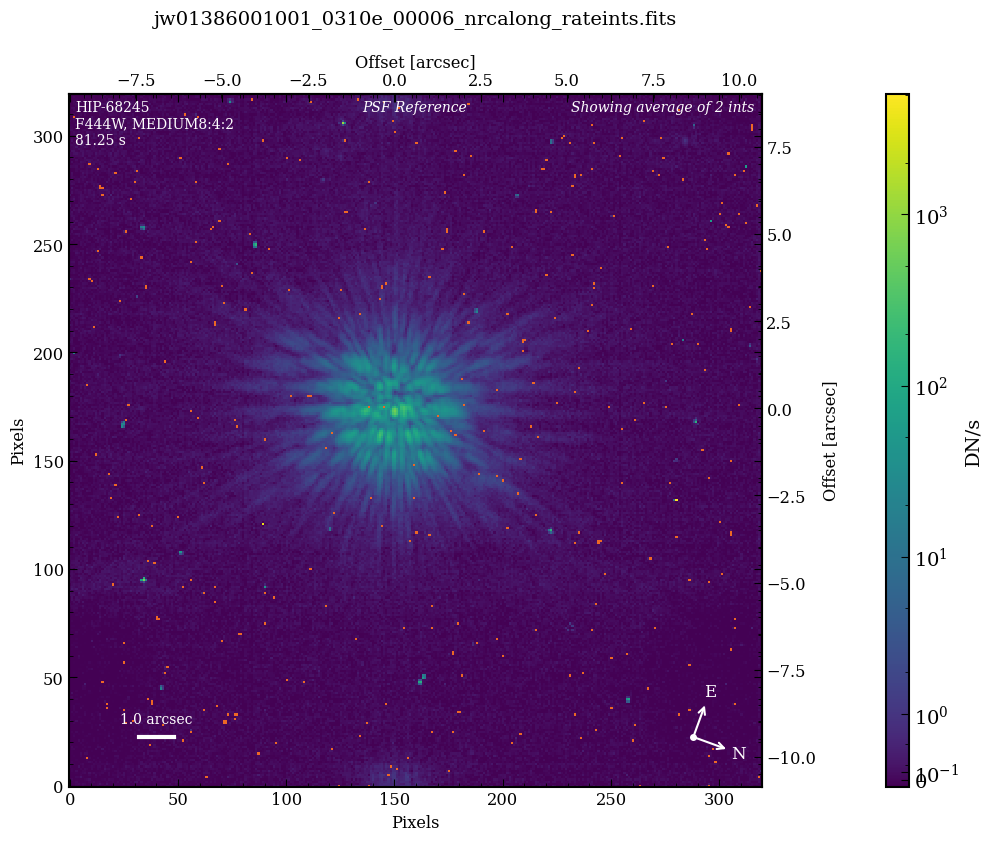

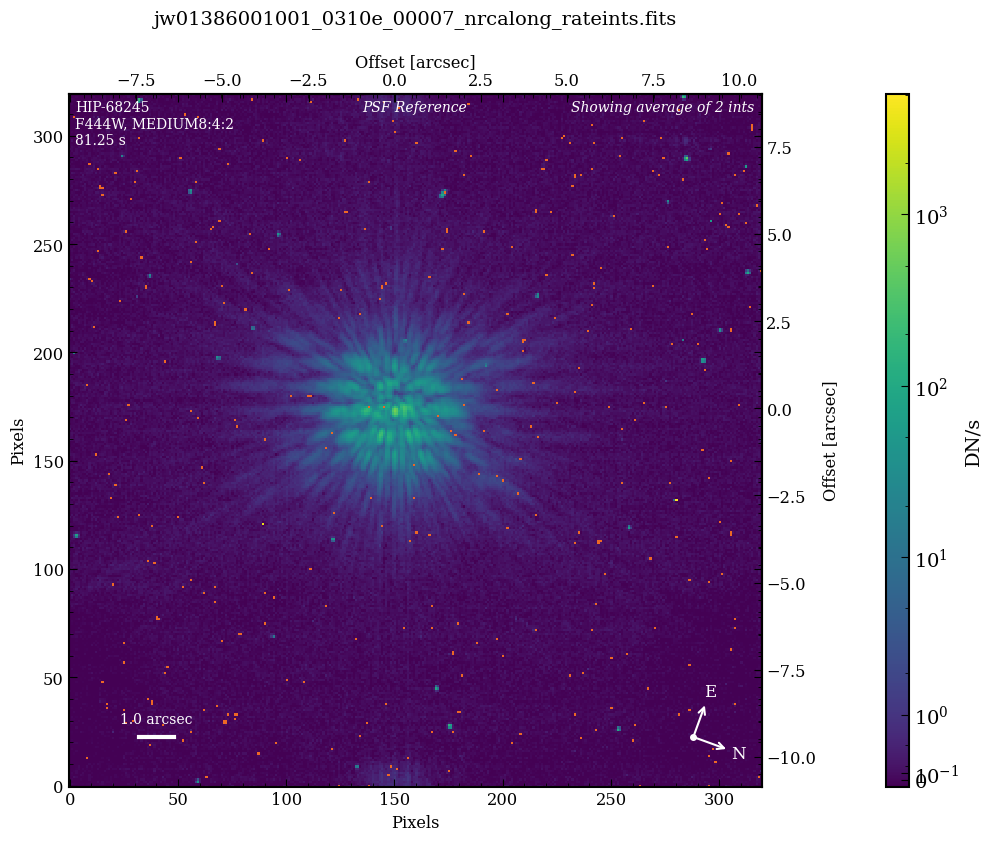

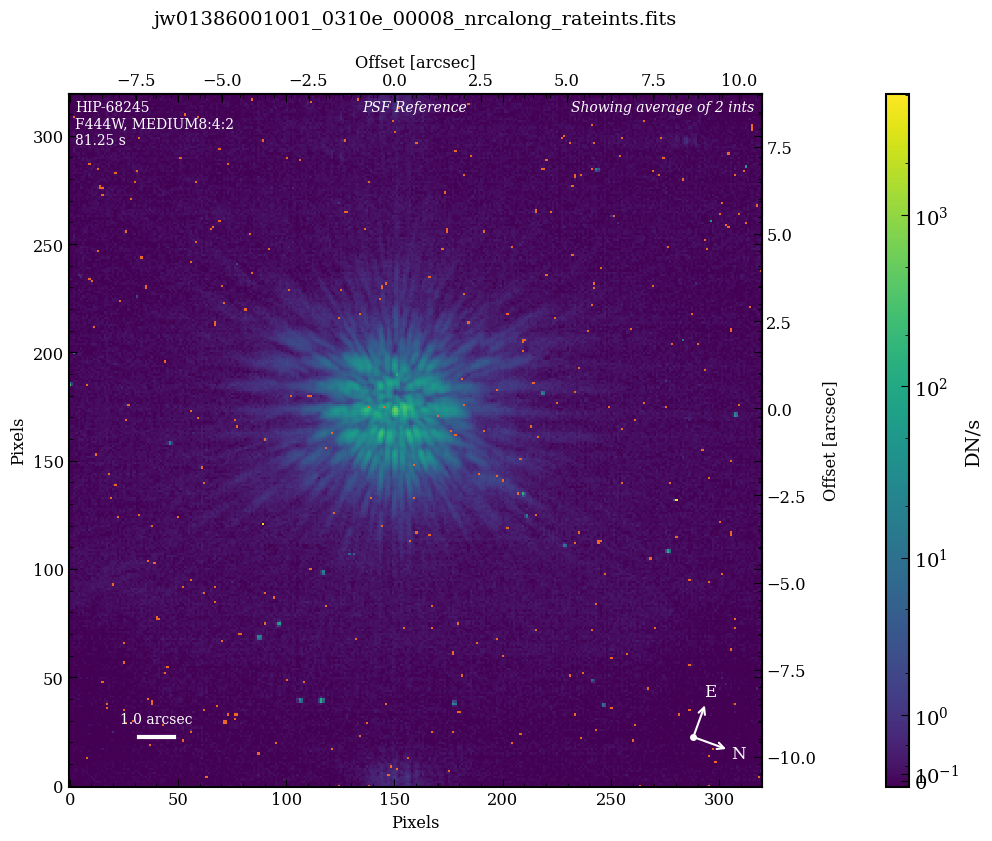

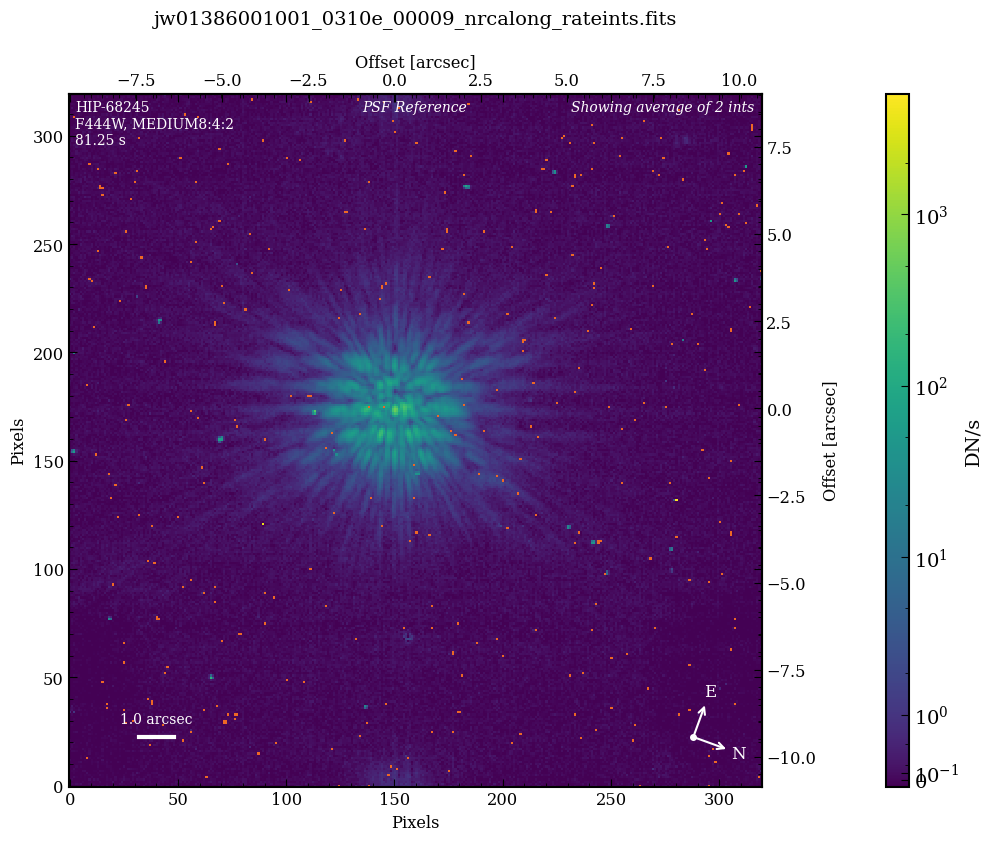

In [5]:
spaceKLIP.plotting.display_coron_dataset(database, 
                                         restrict_to='F444W', save_filename='plots_f444w_stage1.pdf')

# Level 2 reductions

### Optional: Re-read level 1 outputs into database 
This shows how you can start re-reductions at this point, once you have run the previous steps. 

In [4]:
database = spaceKLIP.database.create_database(input_dir = os.path.join(data_root, 'stage1'),
                                              file_type='rateints.fits',
                                              output_dir=data_root, 
                                              pid=1386)

[spaceKLIP.database:INFO] --> Identified 5 concatenation(s)
[spaceKLIP.database:INFO]   --> Concatenation 1: JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R
TYPE  EXP_TYPE DATAMODL TELESCOP  TARGPROP INSTRUME DETECTOR FILTER ...   SUBARRAY  NUMDTHPT XOFFSET YOFFSET  PIXSCALE  BUNIT      ROLL_REF      BLURFWHM
---- --------- -------- -------- --------- -------- -------- ------ ... ----------- -------- ------- ------- ---------- ----- ------------------ --------
 SCI NRC_CORON   STAGE1     JWST HIP-65426   NIRCAM NRCALONG  F250M ... SUB320A335R        1     0.0     0.0 0.06247899  DN/s  110.2786614838192      nan
 SCI NRC_CORON   STAGE1     JWST HIP-65426   NIRCAM NRCALONG  F250M ... SUB320A335R        1     0.0     0.0 0.06247899  DN/s  120.3590367370958      nan
 REF NRC_CORON   STAGE1     JWST HIP-68245   NIRCAM NRCALONG  F250M ... SUB320A335R        9     0.0     0.0 0.06247899  DN/s  110.0084122158856      nan
 REF NRC_CORON   STAGE1     JWST HIP-68245   NIRCAM NRCALONG  F25

TYPE  EXP_TYPE DATAMODL TELESCOP  TARGPROP INSTRUME DETECTOR FILTER ...   SUBARRAY  NUMDTHPT XOFFSET YOFFSET  PIXSCALE  BUNIT      ROLL_REF      BLURFWHM
---- --------- -------- -------- --------- -------- -------- ------ ... ----------- -------- ------- ------- ---------- ----- ------------------ --------
 SCI NRC_CORON   STAGE1     JWST HIP-65426   NIRCAM NRCALONG  F444W ... SUB320A335R        1     0.0     0.0 0.06247899  DN/s  110.2786558985023      nan
 SCI NRC_CORON   STAGE1     JWST HIP-65426   NIRCAM NRCALONG  F444W ... SUB320A335R        1     0.0     0.0 0.06247899  DN/s  120.3590194808035      nan
 REF NRC_CORON   STAGE1     JWST HIP-68245   NIRCAM NRCALONG  F444W ... SUB320A335R        9     0.0     0.0 0.06247899  DN/s 110.00836165914811      nan
 REF NRC_CORON   STAGE1     JWST HIP-68245   NIRCAM NRCALONG  F444W ... SUB320A335R        9     0.0     0.0 0.06247899  DN/s  110.0083913507891      nan
 REF NRC_CORON   STAGE1     JWST HIP-68245   NIRCAM NRCALONG  F444W ... SUB3

### Run level 2 pipeline

Now we run the stage 2 pipeline. Little customization is needed here. 

In [17]:
spaceKLIP.coron2pipeline.run_obs(database=database,
                           steps={'outlier_detection': {'skip': False}},
                           )


[spaceKLIP.coron2pipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386002001_03106_00001_nrcalong_rateints.fits
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386003001_03106_00001_nrcalong_rateints.fits
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03106_00001_nrcalong_rateints.fits
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03106_00002_nrcalong_rateints.fits
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03106_00003_nrcalong_rateints.fits
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03106_00004_nrcalong_rateints.fits
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03106_00005_nrcalong_rateints.fits
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03106_00006_nrcal

And again, we can check the database now contains level 2 reduces versions of all the files:

In [18]:
database.summarize()

NIRCAM_F250M_MASK335R
	STAGE2: 11 files;	2 SCI, 9 REF
NIRCAM_F300M_MASK335R
	STAGE2: 11 files;	2 SCI, 9 REF
NIRCAM_F356W_MASK335R
	STAGE2: 11 files;	2 SCI, 9 REF
NIRCAM_F410M_MASK335R
	STAGE2: 11 files;	2 SCI, 9 REF
NIRCAM_F444W_MASK335R
	STAGE2: 11 files;	2 SCI, 9 REF


### Display the results of the level 2 reductions

These look nearly identical to the stage 1 outputs, but note the image display units have been rescaled from DN/s into physical units of MJy/sr. 

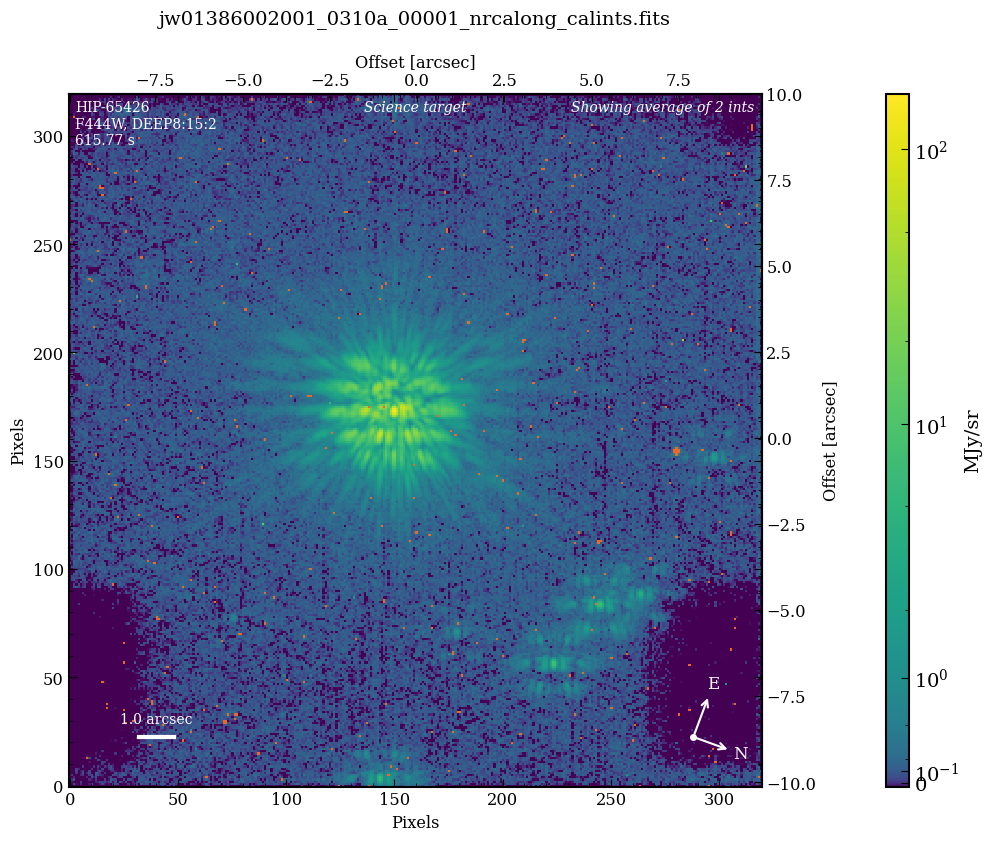

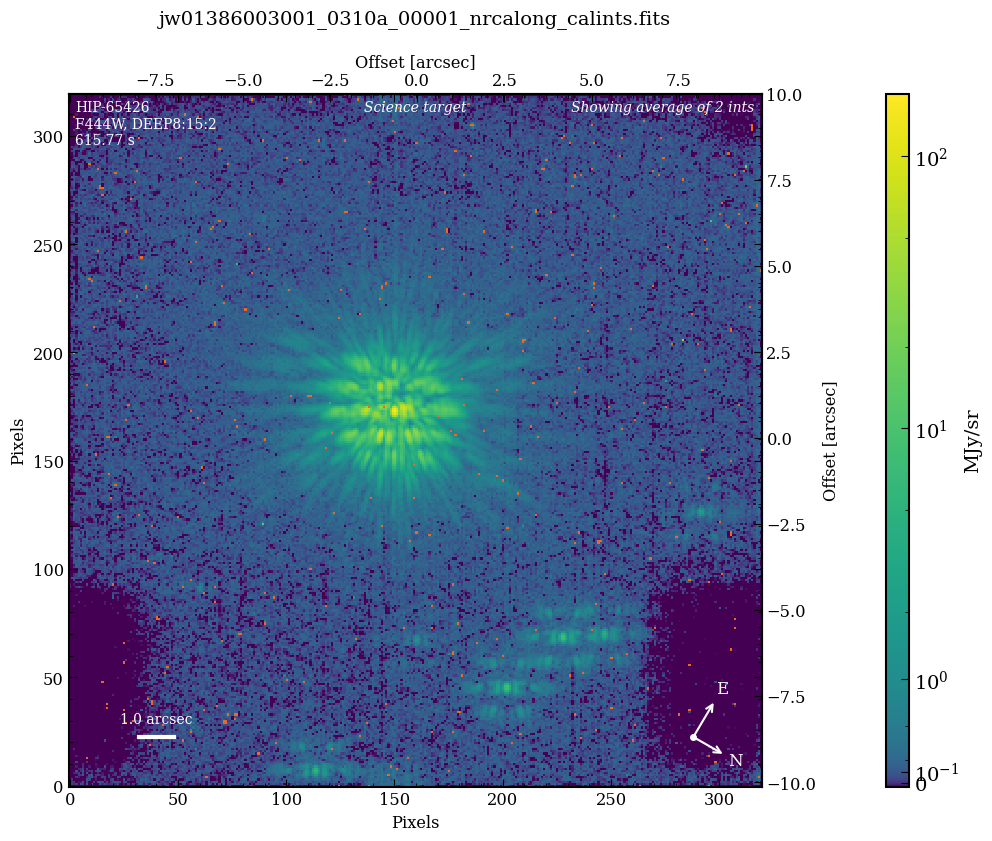

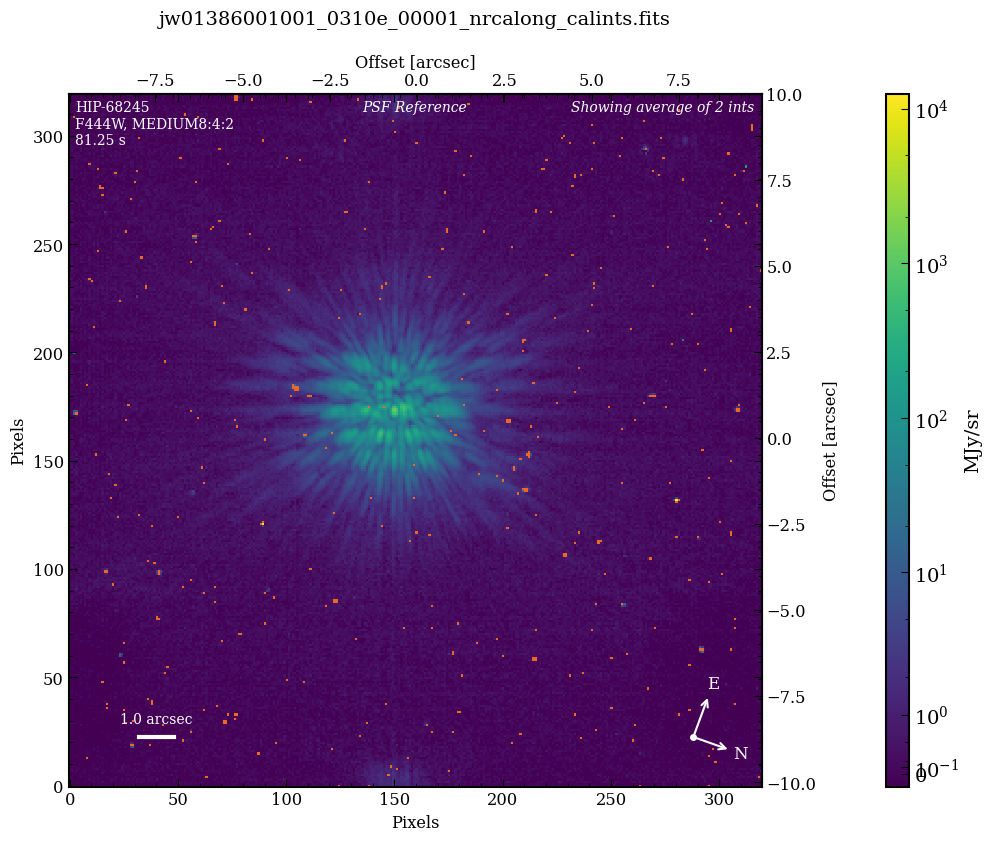

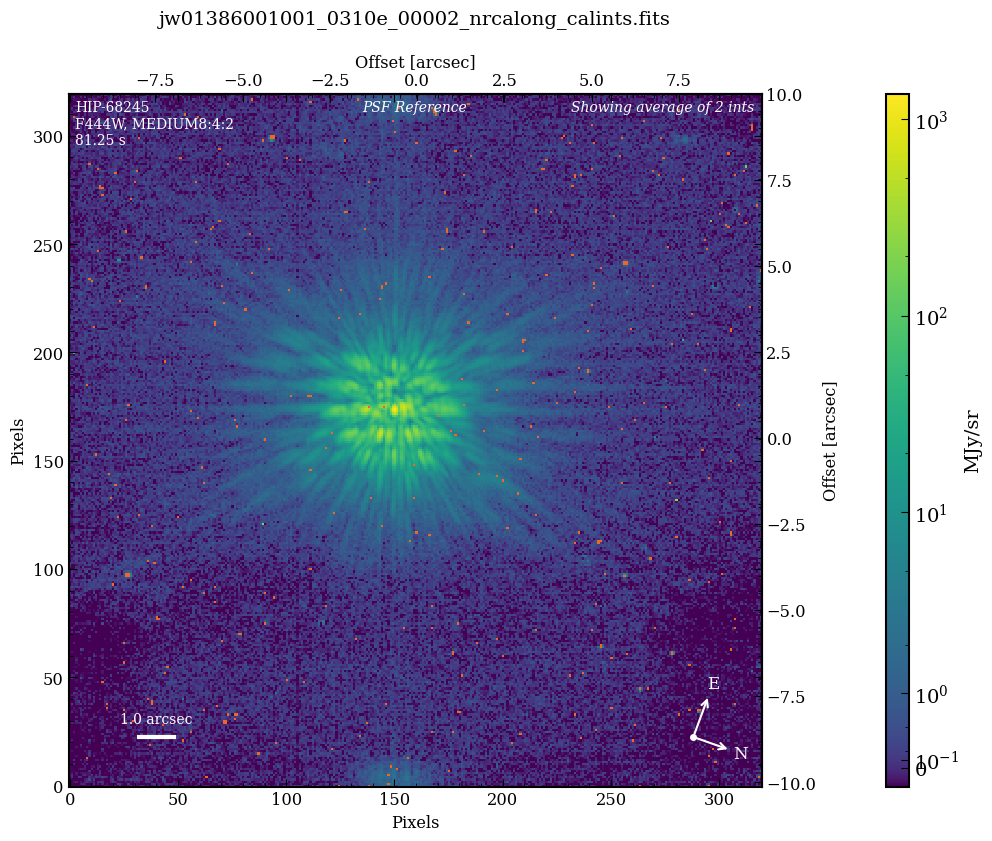

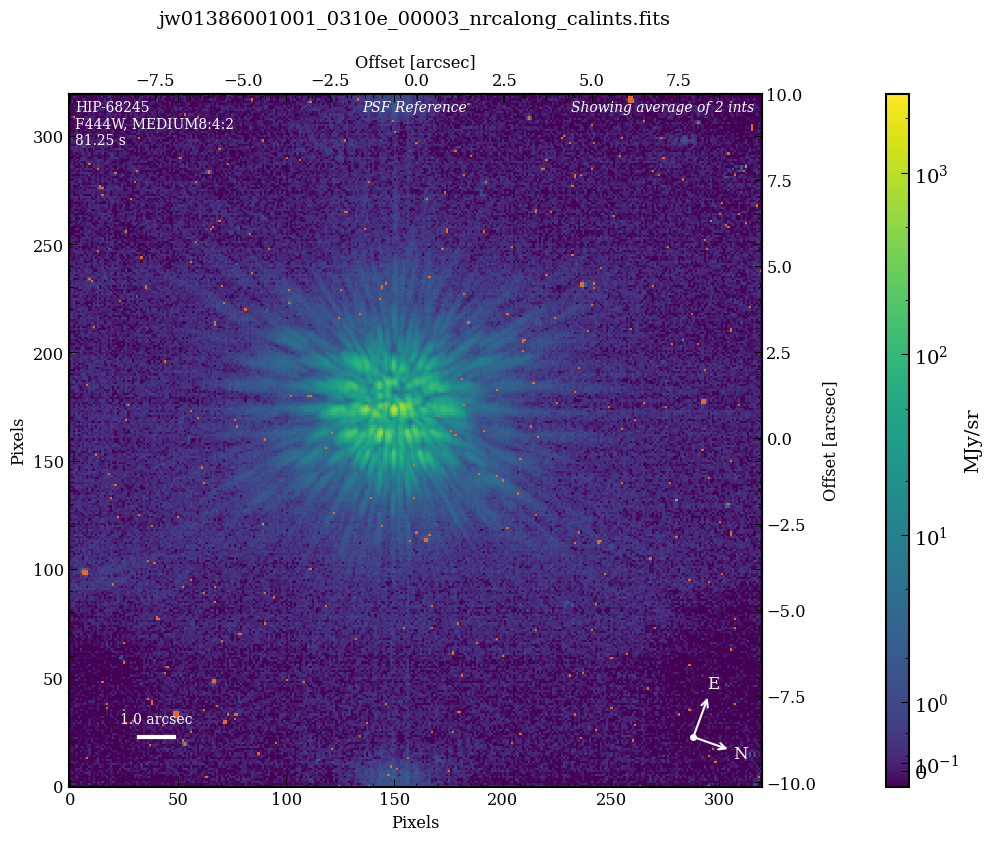

...

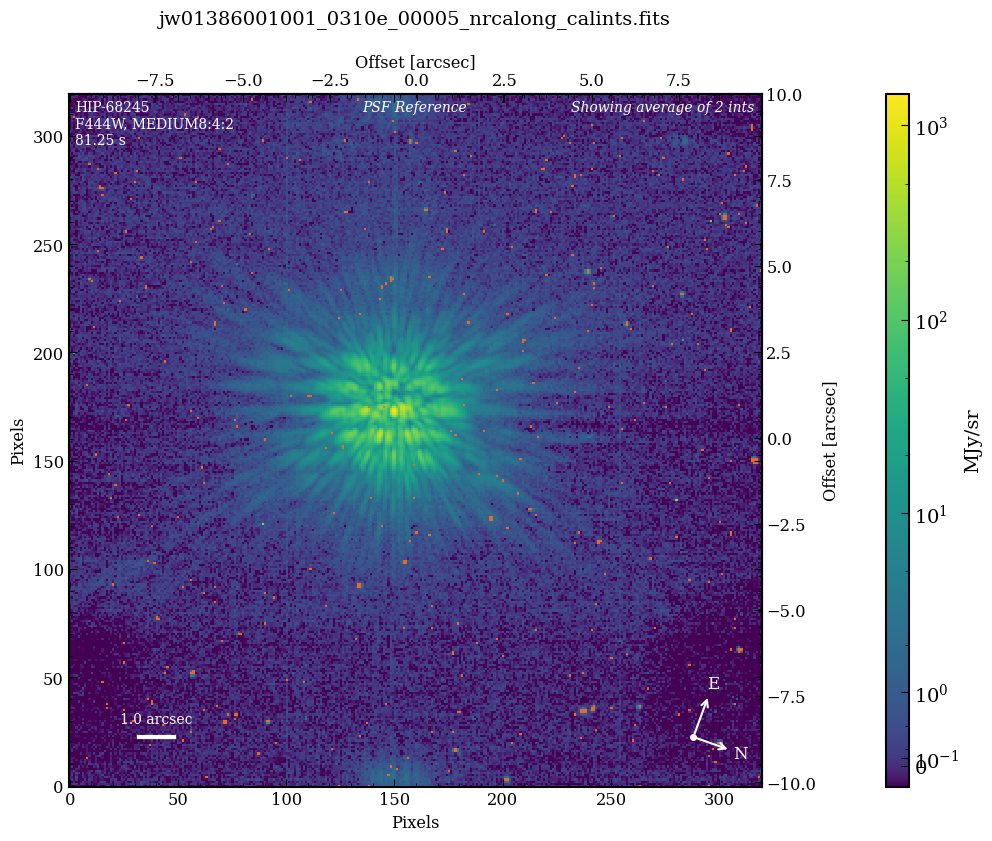

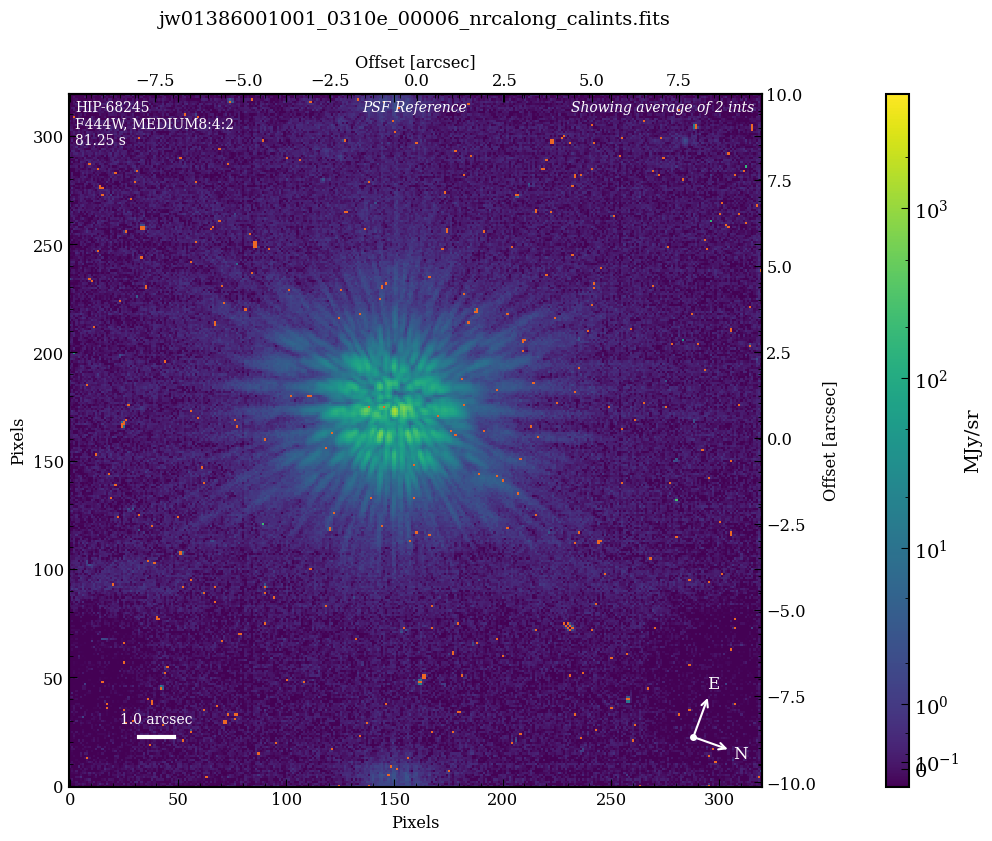

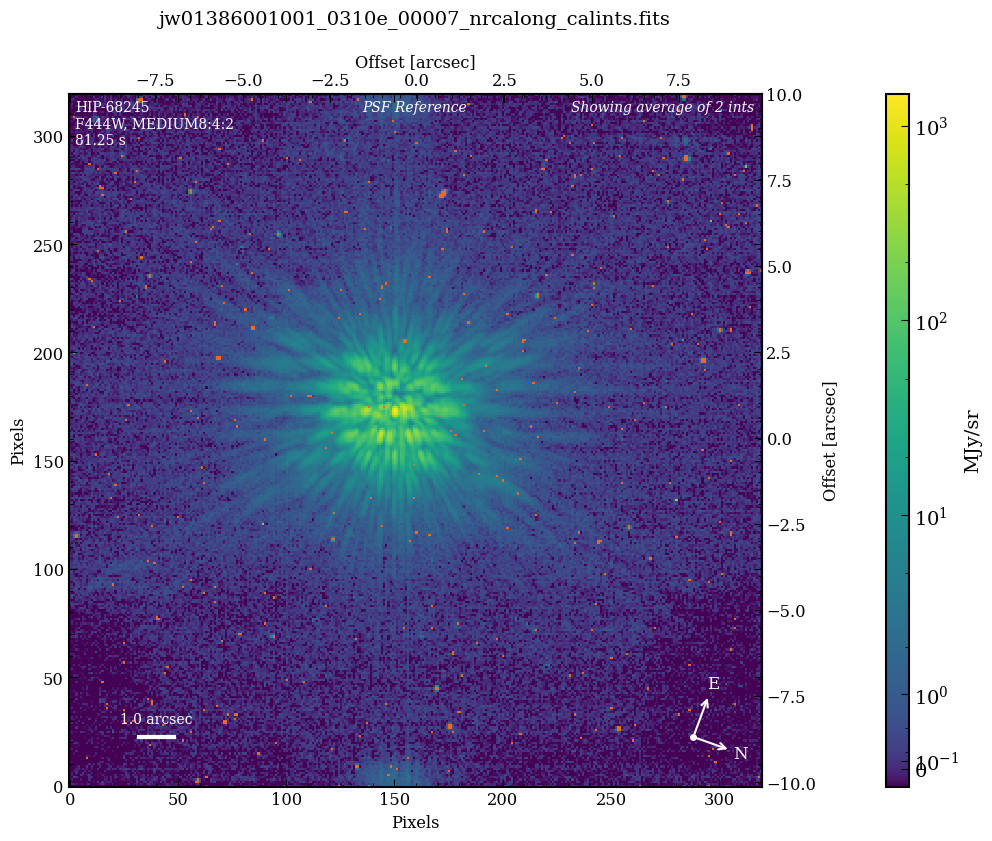

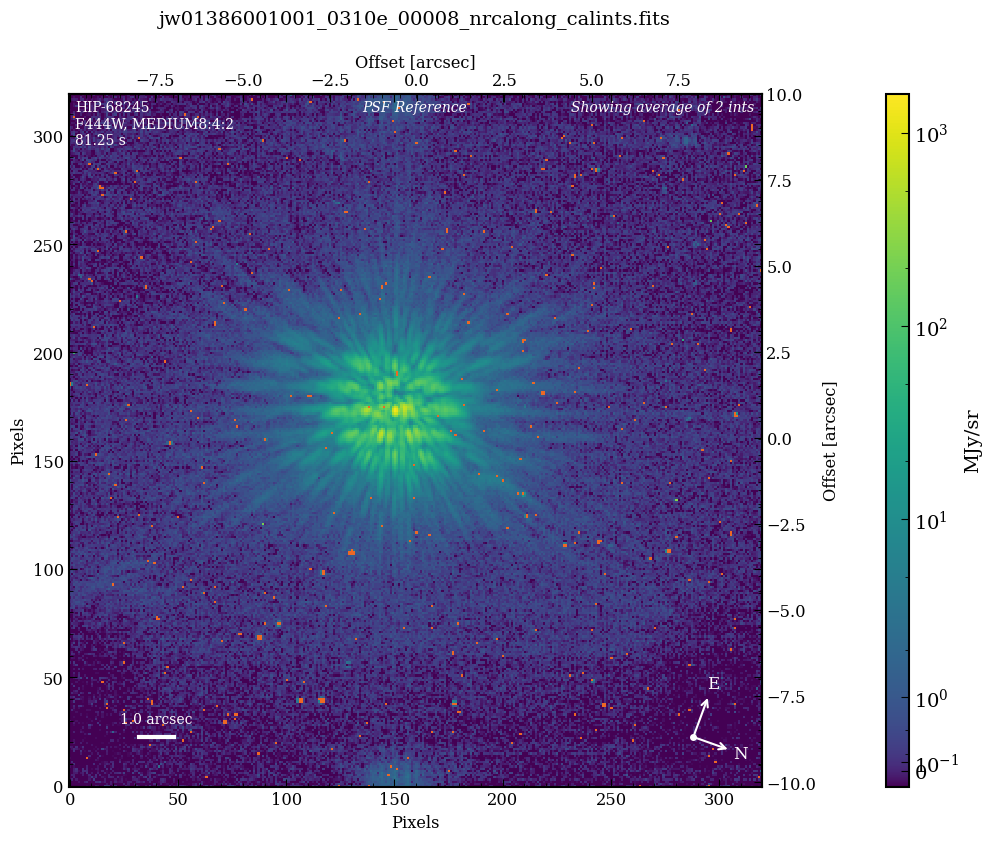

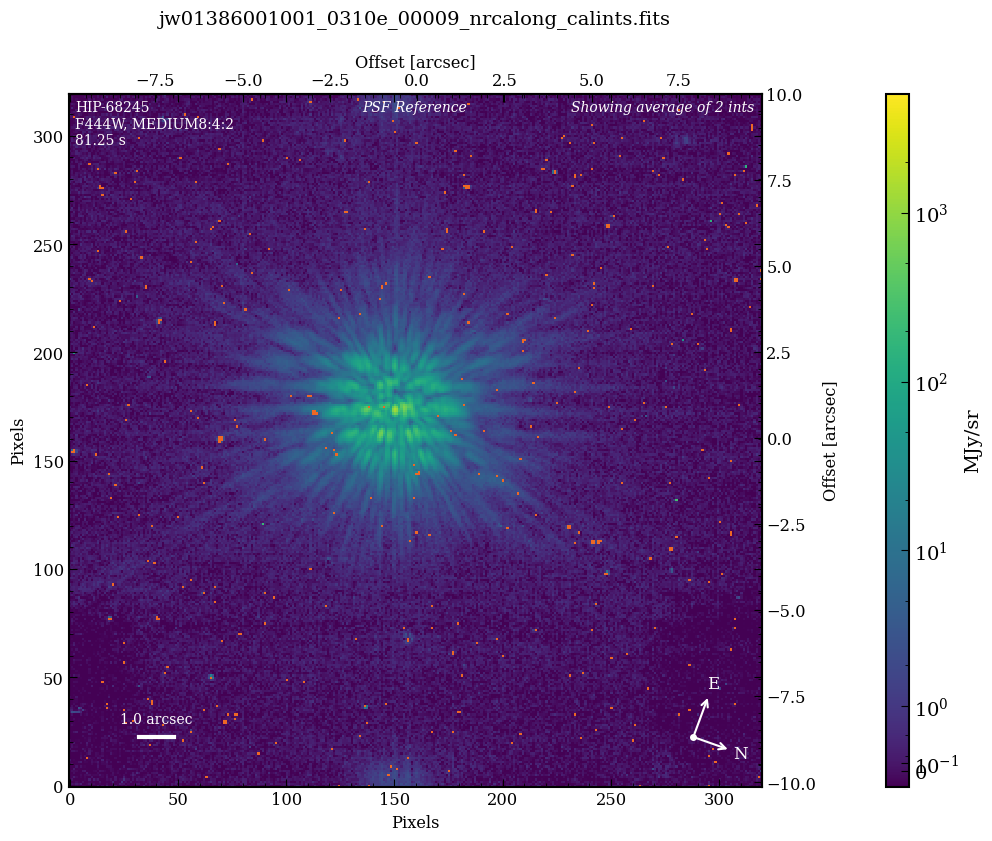

In [7]:
spaceKLIP.plotting.display_coron_dataset(database, 
                                         restrict_to='F444W', save_filename='plots_f444w_stage2.pdf')

# Level 3 reductions: Preparations

### Preparations for PSF subtraction:

As is often the case in high contrast imaging, getting good PSF subtractions depends sensitively on preparing the data ahead of time. 

Here we take special care about image centering, background subtractions, and bad pixel replacement/interpolation, all prior to the PSF subtraction steps

### Optional: Re-read level 2 outputs into database 
This shows how you can start re-reductions at this point, once you have run the previous steps. 

In [4]:
database = spaceKLIP.database.create_database(input_dir = os.path.join(data_root, 'stage2'),
                                              file_type='calints.fits',
                                              output_dir=data_root, 
                                              pid=1386)

[spaceKLIP.database:INFO] --> Identified 5 concatenation(s)
[spaceKLIP.database:INFO]   --> Concatenation 1: JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R
TYPE  EXP_TYPE DATAMODL TELESCOP  TARGPROP INSTRUME DETECTOR FILTER ...   SUBARRAY  NUMDTHPT XOFFSET YOFFSET  PIXSCALE  BUNIT       ROLL_REF      BLURFWHM
---- --------- -------- -------- --------- -------- -------- ------ ... ----------- -------- ------- ------- ---------- ------ ------------------ --------
 SCI NRC_CORON   STAGE2     JWST HIP-65426   NIRCAM NRCALONG  F250M ... SUB320A335R        1     0.0     0.0 0.06247899 MJy/sr  110.2786614838192      nan
 SCI NRC_CORON   STAGE2     JWST HIP-65426   NIRCAM NRCALONG  F250M ... SUB320A335R        1     0.0     0.0 0.06247899 MJy/sr  120.3590367370958      nan
 REF NRC_CORON   STAGE2     JWST HIP-68245   NIRCAM NRCALONG  F250M ... SUB320A335R        9     0.0     0.0 0.06247899 MJy/sr  110.0084122158856      nan
 REF NRC_CORON   STAGE2     JWST HIP-68245   NIRCAM NRCALONG

TYPE  EXP_TYPE DATAMODL TELESCOP  TARGPROP INSTRUME DETECTOR FILTER ...   SUBARRAY  NUMDTHPT XOFFSET YOFFSET  PIXSCALE  BUNIT       ROLL_REF      BLURFWHM
---- --------- -------- -------- --------- -------- -------- ------ ... ----------- -------- ------- ------- ---------- ------ ------------------ --------
 SCI NRC_CORON   STAGE2     JWST HIP-65426   NIRCAM NRCALONG  F444W ... SUB320A335R        1     0.0     0.0 0.06247899 MJy/sr  110.2786558985023      nan
 SCI NRC_CORON   STAGE2     JWST HIP-65426   NIRCAM NRCALONG  F444W ... SUB320A335R        1     0.0     0.0 0.06247899 MJy/sr  120.3590194808035      nan
 REF NRC_CORON   STAGE2     JWST HIP-68245   NIRCAM NRCALONG  F444W ... SUB320A335R        9     0.0     0.0 0.06247899 MJy/sr 110.00836165914811      nan
 REF NRC_CORON   STAGE2     JWST HIP-68245   NIRCAM NRCALONG  F444W ... SUB320A335R        9     0.0     0.0 0.06247899 MJy/sr  110.0083913507891      nan
 REF NRC_CORON   STAGE2     JWST HIP-68245   NIRCAM NRCALONG  F444W ..

### Extra image processing to improve coronagraphic reductions

In [5]:
# Initialize spaceKLIP image manipulation tools class.

imageTools = spaceKLIP.imagetools.ImageTools(database=database)


<div class="alert alert-block alert-info">
    <b>NIRCam-specific information:</b> The <tt>subtract_median</tt> background subtraction step is only recommended for NIRCam, not MIRI.</div>

In [6]:
# Median-subtract each frame to mitigate uncalibrated bias drifts. 

imageTools.subtract_median(types=['SCI', 'SCI_TA', 'SCI_BG', 'REF', 'REF_TA', 'REF_BG'],
                           subdir='medsub')


[spaceKLIP.imagetools:INFO] Median subtraction using method=border
[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.08
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386003001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.09
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386001001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.15
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386001001_03106_00002_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.18
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386001001_03106_00003_nrcalong_calint

[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386001001_0310a_00008_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.16
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386001001_0310a_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.12
[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F444W_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386002001_0310a_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.08
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386003001_0310a_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.09
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386001001_0310e_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean o

For NIRCam, the JWST pipeline does not sufficiently repair bad pixels (i.e. anomalous outliers) within the coronagraphic subarrays. 

Here we use custom functions within spaceKLIP to detect and repair bad pixels. 


<div class="alert alert-block alert-info">
    <b>NIRCam-specific information:</b> The <tt>fix_bad_pixels</tt> step was developed originally for NIRCam
and is tuned to work pretty well on NIRCam data. </div>

In [7]:
# Fix bad pixels using custom spaceKLIP routines. Multiple routines can be
# combined in a custom order by joining them with a + sign.
# - bpclean: use sigma clipping to find additional bad pixels.
# - custom: use custom map to find additional bad pixels.
# - timemed: replace pixels which are only bad in some frames with their
#            median value from the good frames.
# - dqmed:   replace bad pixels with the median of surrounding good
#            pixels.
# - medfilt: replace bad pixels with an image plane median filter.


imageTools.fix_bad_pixels(method='bpclean+timemed+dqmed+medfilt',
                          bpclean_kwargs={'sigclip': 3,
                                          'shift_x': [-1, 0, 1],
                                          'shift_y': [-1, 0, 1]},
                          custom_kwargs={},
                          timemed_kwargs={},
                          dqmed_kwargs={'shift_x': [-1, 0, 1],
                                        'shift_y': [-1, 0, 1]},
                          medfilt_kwargs={'size': 4},
                          subdir='bpcleaned')

[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Method bpclean: jw01386002001_03106_00001_nrcalong_calints.fits
Frame 4/4, iteration 5
[spaceKLIP.imagetools:INFO]   --> Method bpclean: identified 8792 additional bad pixel(s) -- 2.15%
[spaceKLIP.imagetools:INFO]   --> Method timemed: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method timemed: fixing 8418 bad pixel(s) -- 2.06%
[spaceKLIP.imagetools:INFO]   --> Method dqmed: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method dqmed: fixing 1836 bad pixel(s) -- 0.45%
[spaceKLIP.imagetools:INFO]   --> Method medfilt: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method medfilt: fixing 0 bad pixel(s) -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Method bpclean: jw01386003001_03106_00001_nrcalong_calints.fits
Frame 4/4, iteration 5
[spaceKLIP.imageto

[spaceKLIP.imagetools:INFO]   --> Method medfilt: jw01386001001_03106_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method medfilt: fixing 0 bad pixel(s) -- 0.00%
[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F300M_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Method bpclean: jw01386002001_03107_00001_nrcalong_calints.fits
Frame 4/4, iteration 4
[spaceKLIP.imagetools:INFO]   --> Method bpclean: identified 8437 additional bad pixel(s) -- 2.06%
[spaceKLIP.imagetools:INFO]   --> Method timemed: jw01386002001_03107_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method timemed: fixing 8299 bad pixel(s) -- 2.03%
[spaceKLIP.imagetools:INFO]   --> Method dqmed: jw01386002001_03107_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method dqmed: fixing 1596 bad pixel(s) -- 0.39%
[spaceKLIP.imagetools:INFO]   --> Method medfilt: jw01386002001_03107_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method 

[spaceKLIP.imagetools:INFO]   --> Method dqmed: jw01386001001_03108_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method dqmed: fixing 1552 bad pixel(s) -- 0.38%
[spaceKLIP.imagetools:INFO]   --> Method medfilt: jw01386001001_03108_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method medfilt: fixing 0 bad pixel(s) -- 0.00%
[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F356W_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Method bpclean: jw01386002001_03109_00001_nrcalong_calints.fits
Frame 2/2, iteration 5
[spaceKLIP.imagetools:INFO]   --> Method bpclean: identified 3663 additional bad pixel(s) -- 1.79%
[spaceKLIP.imagetools:INFO]   --> Method timemed: jw01386002001_03109_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method timemed: fixing 3374 bad pixel(s) -- 1.65%
[spaceKLIP.imagetools:INFO]   --> Method dqmed: jw01386002001_03109_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method dq

[spaceKLIP.imagetools:INFO]   --> Method timemed: jw01386001001_0310c_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method timemed: fixing 3713 bad pixel(s) -- 1.81%
[spaceKLIP.imagetools:INFO]   --> Method dqmed: jw01386001001_0310c_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method dqmed: fixing 998 bad pixel(s) -- 0.49%
[spaceKLIP.imagetools:INFO]   --> Method medfilt: jw01386001001_0310c_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method medfilt: fixing 0 bad pixel(s) -- 0.00%
[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F410M_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Method bpclean: jw01386002001_03108_00001_nrcalong_calints.fits
Frame 2/2, iteration 5
[spaceKLIP.imagetools:INFO]   --> Method bpclean: identified 3997 additional bad pixel(s) -- 1.95%
[spaceKLIP.imagetools:INFO]   --> Method timemed: jw01386002001_03108_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method t

[spaceKLIP.imagetools:INFO]   --> Method bpclean: jw01386001001_0310a_00009_nrcalong_calints.fits
Frame 2/2, iteration 5
[spaceKLIP.imagetools:INFO]   --> Method bpclean: identified 4462 additional bad pixel(s) -- 2.18%
[spaceKLIP.imagetools:INFO]   --> Method timemed: jw01386001001_0310a_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method timemed: fixing 4191 bad pixel(s) -- 2.05%
[spaceKLIP.imagetools:INFO]   --> Method dqmed: jw01386001001_0310a_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method dqmed: fixing 998 bad pixel(s) -- 0.49%
[spaceKLIP.imagetools:INFO]   --> Method medfilt: jw01386001001_0310a_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method medfilt: fixing 0 bad pixel(s) -- 0.00%
[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F444W_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Method bpclean: jw01386002001_0310a_00001_nrcalong_calints.fits
Frame 2/2, iteration 5
[spaceKLIP.imagetoo

[spaceKLIP.imagetools:INFO]   --> Method medfilt: jw01386001001_0310e_00008_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method medfilt: fixing 0 bad pixel(s) -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Method bpclean: jw01386001001_0310e_00009_nrcalong_calints.fits
Frame 2/2, iteration 6
[spaceKLIP.imagetools:INFO]   --> Method bpclean: identified 3899 additional bad pixel(s) -- 1.90%
[spaceKLIP.imagetools:INFO]   --> Method timemed: jw01386001001_0310e_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method timemed: fixing 3682 bad pixel(s) -- 1.80%
[spaceKLIP.imagetools:INFO]   --> Method dqmed: jw01386001001_0310e_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method dqmed: fixing 992 bad pixel(s) -- 0.48%
[spaceKLIP.imagetools:INFO]   --> Method medfilt: jw01386001001_0310e_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method medfilt: fixing 0 bad pixel(s) -- 0.00%


### Finish pixel cleanup

Optinally, any remaining bad pixels we interpolate to replace NaNs with zero. 

In this case, this step is not actually needed since already all the bad pixels have been fixed in the above step. So we can run this for example purposes, but it does not change any pixel values. 

In [8]:
# Replace nans.
imageTools.replace_nans(cval=0.,
                        types=['SCI', 'SCI_BG', 'REF', 'REF_BG'],
                        subdir='nanreplaced')


[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386003001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386001001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386001001_03106_00002_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386001001_03106_00003_nrcalong_calints.fits
[spaceK

[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386001001_0310a_00006_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386001001_0310a_00007_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386001001_0310a_00008_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386001001_0310a_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F444W_MASKRND_MASK335R_SUB320A335R
[spaceK

### Improve PSF centering and alignment


<div class="alert alert-block alert-info">
    <b>NIRCam-specific information:</b> These steps for update_center, recenter_frames, align_frames are only recommended for use on NIRCam data at this time.  </div>


#### Update NIRCam PSF center metadata, then recenter frames

This is an extra step to update header metadata for locations of the coronagraphs.

This uses a table of better center locations measured by Jarron Leisenring.
Replaces the header values for the CRPIX locations for the mask locations.

Eventually the more precise location inormation will be in CRDS and this step will not be necessary 

In [9]:
# this changes only the mask center information in the database table. No change in the observed data

imageTools.update_nircam_centers()

[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy centers: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy centers: old = (150.10, 174.20), new = (150.26, 172.56)
[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy centers: jw01386003001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy centers: old = (150.10, 174.20), new = (150.26, 172.56)
[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy centers: jw01386001001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy centers: old = (150.10, 174.20), new = (150.26, 172.56)
[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy centers: jw01386001001_03106_00002_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy centers: old =

[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy centers: old = (150.10, 174.20), new = (150.41, 174.47)
[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy centers: jw01386003001_03108_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy centers: old = (150.10, 174.20), new = (150.41, 174.47)
[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy centers: jw01386001001_0310a_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy centers: old = (150.10, 174.20), new = (150.41, 174.47)
[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy centers: jw01386001001_0310a_00002_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy centers: old = (150.10, 174.20), new = (150.41, 174.47)
[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy centers: jw01386001001_0310a_00003_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Update NIRCam coronagraphy

To better measure the location of the star with respect to the coronagraph, we create a simulation of the star behind the coronagraph (using webbpsf), and cross-correlate this with the observed PSF. The cross correlation peak is used to infer the offset of the star relative to the mask center.  The measured offset is used to shift the first frame to be centered. Then subsequent frames are aligned to that first frame. 

The accuracy of this algorithm is around 7 milliarcsec according to testing. 

This step also shifts to account for the coronagraph not being precisely centered in the subarray. After this step, the star center will be at the center of the pixel array. 

In [10]:
imageTools.recenter_frames(spectral_type='A2V')  

# The spectral type is used to make a more accurate PSF simulation for the star

# This step changes the pixel data in the first science frame to center it.

# The other subsequent frames are shifted identically. I.e. the shift to center the first SCI frame
# is applied to all SCI and REF frames. 

[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recenter frames: generating WebbPSF image for absolute centering (this might take a while)
[spaceKLIP.psf:INFO] Generating on-axis and off-axis PSFs...
[spaceKLIP.psf:INFO]   Done.
[spaceKLIP.imagetools:INFO]   --> Recenter frames: star offset from coronagraph center (dx, dy) = (0.19, -0.15) pix
[spaceKLIP.imagetools:INFO]  Plot saved in data_nircam_hd65426/recentered/JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R_recenter.pdf
[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recenter frames: median required shift = 971.11 mas
[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386003001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recente

[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386003001_03109_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386003001_03109_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recenter frames: median required shift = 1033.21 mas
[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386001001_0310c_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386001001_0310c_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recenter frames: median required shift = 1033.21 mas
[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386001001_0310c_00002_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386001001_0310c_00002_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recenter frames: median required shift = 1033.21 mas
[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386001001_0310c_00003_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recenter fra

[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386001001_0310e_00003_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386001001_0310e_00003_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recenter frames: median required shift = 1050.89 mas
[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386001001_0310e_00004_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386001001_0310e_00004_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recenter frames: median required shift = 1050.89 mas
[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386001001_0310e_00005_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386001001_0310e_00005_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recenter frames: median required shift = 1050.89 mas
[spaceKLIP.imagetools:INFO]   --> Recenter frames: jw01386001001_0310e_00006_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Recenter fra

This step saves output PDFs with plots showing the centering information results. 

In [11]:
!ls data_nircam_hd65426/recentered/*pdf

data_nircam_hd65426/recentered/JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R_recenter.pdf
data_nircam_hd65426/recentered/JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R_recenter.pdf
data_nircam_hd65426/recentered/JWST_NIRCAM_NRCALONG_F300M_MASKRND_MASK335R_SUB320A335R_recenter.pdf
data_nircam_hd65426/recentered/JWST_NIRCAM_NRCALONG_F300M_MASKRND_MASKA335R_SUB320A335R_recenter.pdf
data_nircam_hd65426/recentered/JWST_NIRCAM_NRCALONG_F356W_MASKRND_MASK335R_SUB320A335R_recenter.pdf
data_nircam_hd65426/recentered/JWST_NIRCAM_NRCALONG_F356W_MASKRND_MASKA335R_SUB320A335R_recenter.pdf
data_nircam_hd65426/recentered/JWST_NIRCAM_NRCALONG_F410M_MASKRND_MASK335R_SUB320A335R_recenter.pdf
data_nircam_hd65426/recentered/JWST_NIRCAM_NRCALONG_F410M_MASKRND_MASKA335R_SUB320A335R_recenter.pdf
data_nircam_hd65426/recentered/JWST_NIRCAM_NRCALONG_F444W_MASKRND_MASK335R_SUB320A335R_recenter.pdf
data_nircam_hd65426/recentered/JWST_NIRCAM_NRCALONG_F444W_MASKRND_MASKA335R_SUB320A335R_recenter

In [12]:
# Optional, open one of the plots to view it. (note, use of !open assumes you are running this on Mac OS)

!open data_nircam_hd65426/recentered/JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R_recenter.pdf

### Align Frames

This step applies shifts to the image pixel data to align frames. All subsequent frames are aligned to the first frame of the first science integration.  (I.e. the second roll and all references are aligned to the first roll). 

This measures and applies relative shifts between subsequent frames and the first frame. 

In [13]:
#Align Frames Use image registration to align all frames in a concatenation to the
# first science frame in that concatenation.
imageTools.align_frames(method='fourier',
                        kwargs={},
                        subdir='aligned')

[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 0.19 mas
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386003001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 3.07 mas
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386001001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 10.57 mas
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386001001_03106_00002_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 30.47 mas
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386001001_03106_00003_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 20.90 mas
[spaceKLIP

[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 5.05 mas
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386001001_0310a_00006_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 15.05 mas
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386001001_0310a_00007_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 30.14 mas
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386001001_0310a_00008_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 37.16 mas
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386001001_0310a_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 40.89 mas
[spaceKLIP.imagetools:INFO]  Plot saved in data_nircam_hd65426/aligned/JWST_NIRCAM_NRCALONG_F410M_MASKRND_MASK335R_SUB320A335R_align_sci.pdf
[spaceKLIP.imagetools:INFO]  Plot saved in data_nircam_hd65426/ali

In [14]:
# This step also outputs plots that show the results of the alignment

!ls data_nircam_hd65426/aligned/*pdf

data_nircam_hd65426/aligned/JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R_align_ref.pdf
data_nircam_hd65426/aligned/JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R_align_sci.pdf
data_nircam_hd65426/aligned/JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R_align_ref.pdf
data_nircam_hd65426/aligned/JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R_align_sci.pdf
data_nircam_hd65426/aligned/JWST_NIRCAM_NRCALONG_F300M_MASKRND_MASK335R_SUB320A335R_align_ref.pdf
data_nircam_hd65426/aligned/JWST_NIRCAM_NRCALONG_F300M_MASKRND_MASK335R_SUB320A335R_align_sci.pdf
data_nircam_hd65426/aligned/JWST_NIRCAM_NRCALONG_F300M_MASKRND_MASKA335R_SUB320A335R_align_ref.pdf
data_nircam_hd65426/aligned/JWST_NIRCAM_NRCALONG_F300M_MASKRND_MASKA335R_SUB320A335R_align_sci.pdf
data_nircam_hd65426/aligned/JWST_NIRCAM_NRCALONG_F356W_MASKRND_MASK335R_SUB320A335R_align_ref.pdf
data_nircam_hd65426/aligned/JWST_NIRCAM_NRCALONG_F356W_MASKRND_MASK335R_SUB320A335R_align_sci.pdf
data_nircam_hd65

In [15]:
# Open one to view the alignment of the reference images.
!open data_nircam_hd65426/aligned/JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R_align_ref.pdf


### Pad empty space around frames
to give space to rotate and align during pyklip. THis puts a region of NAN pixels around the outside. 

In [16]:
# Pad all frames.
imageTools.pad_frames(npix=80,
                      cval=np.nan,
                      types=['SCI', 'SCI_BG', 'REF', 'REF_BG'],
                      subdir='padded')


[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape = (320, 320), new shape = (480, 480), fill value = nan
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386003001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape = (320, 320), new shape = (480, 480), fill value = nan
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386001001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape = (320, 320), new shape = (480, 480), fill value = nan
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386001001_03106_00002_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape = (320, 320), new shape = (480, 480), fill value = nan
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw013

[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386001001_0310a_00003_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape = (320, 320), new shape = (480, 480), fill value = nan
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386001001_0310a_00004_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape = (320, 320), new shape = (480, 480), fill value = nan
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386001001_0310a_00005_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape = (320, 320), new shape = (480, 480), fill value = nan
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386001001_0310a_00006_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape = (320, 320), new shape = (480, 480), fill value = nan
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386001001_0310a_00007_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape 

### Display the cleaned datasets after all of the above

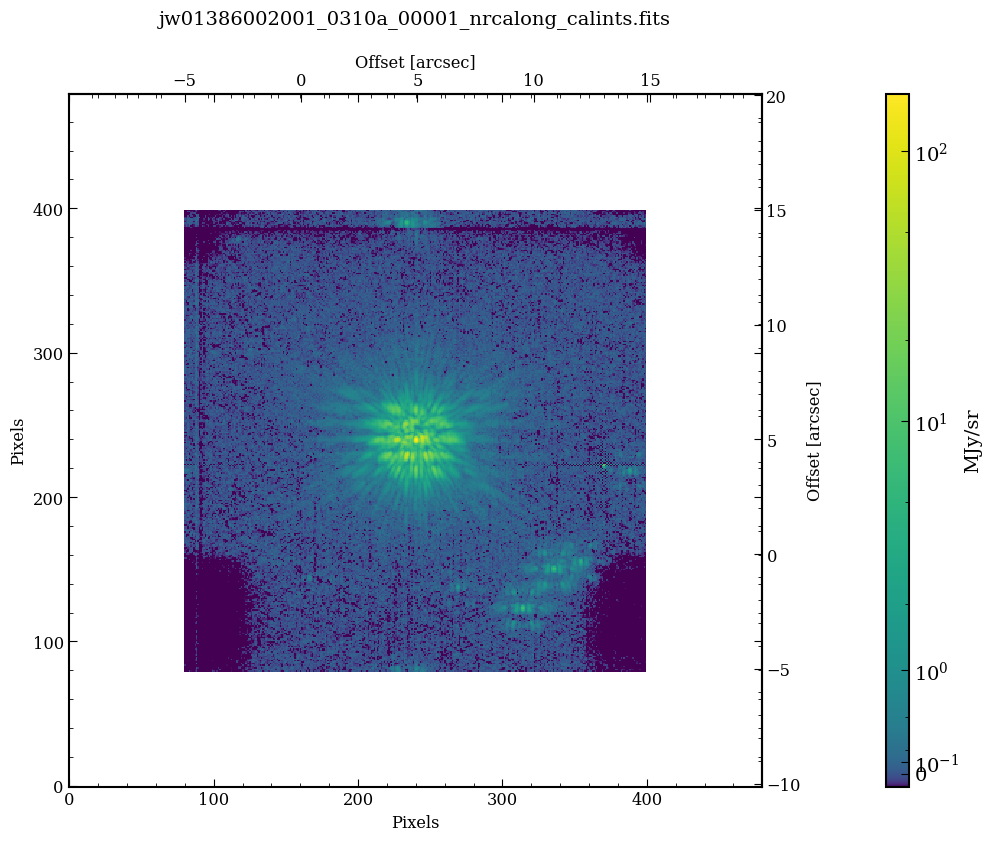

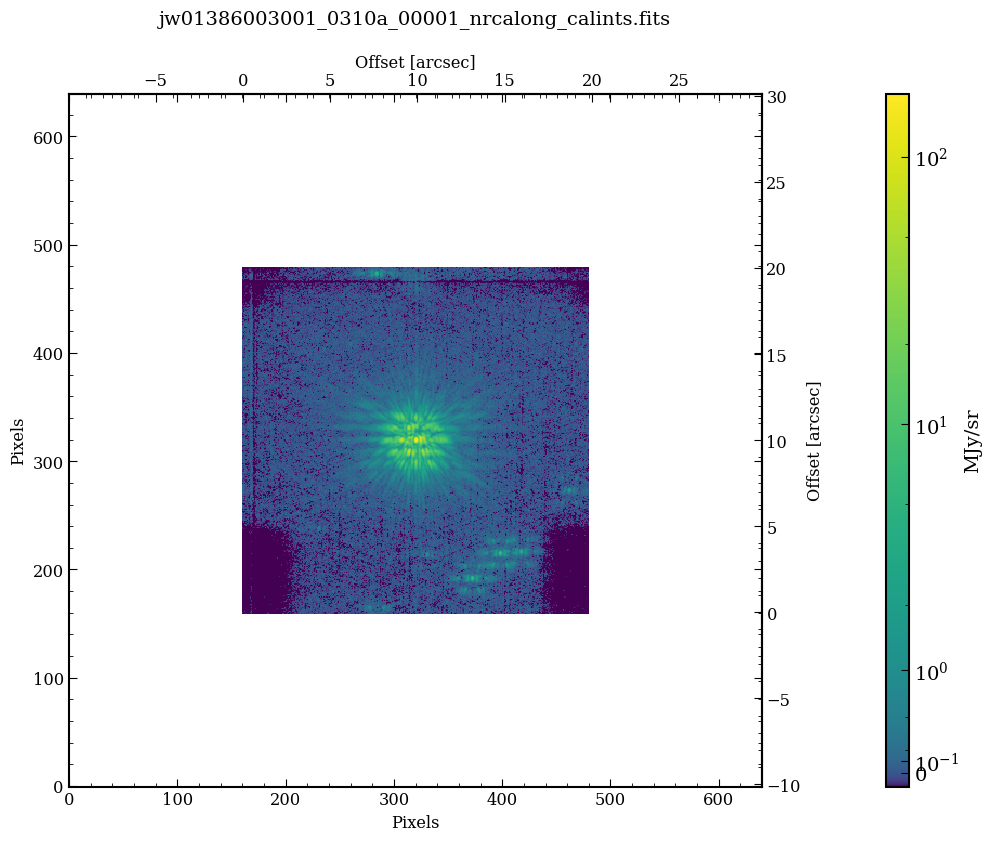

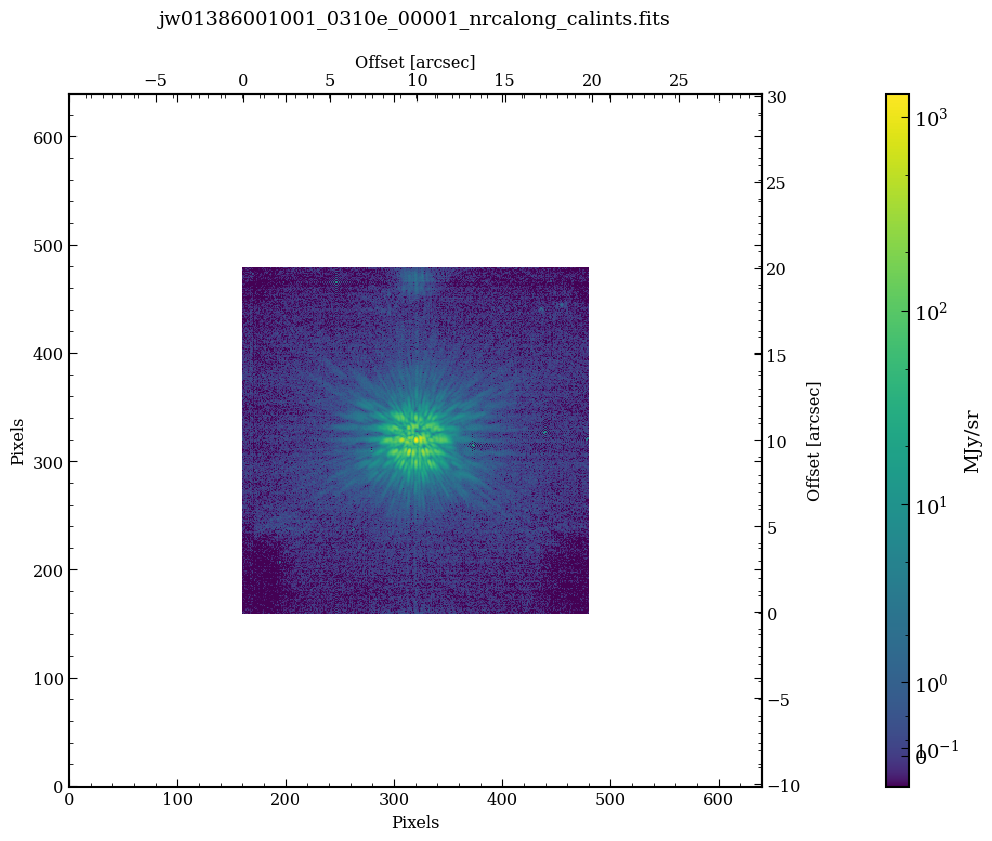

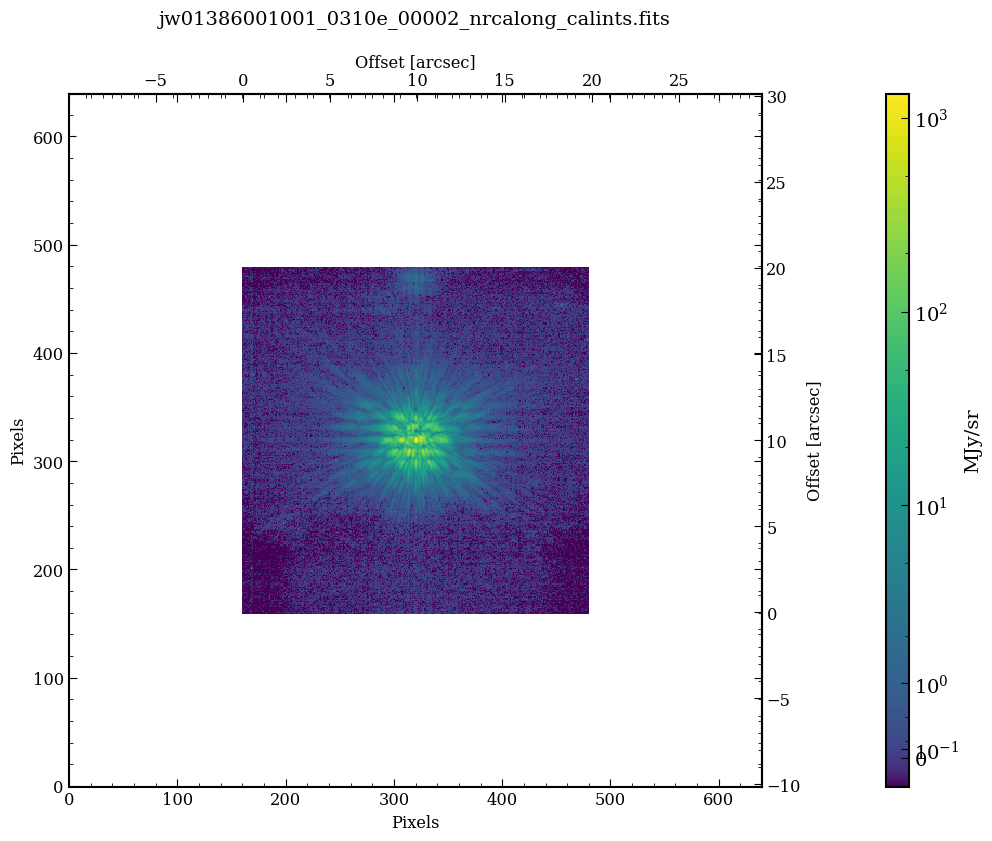

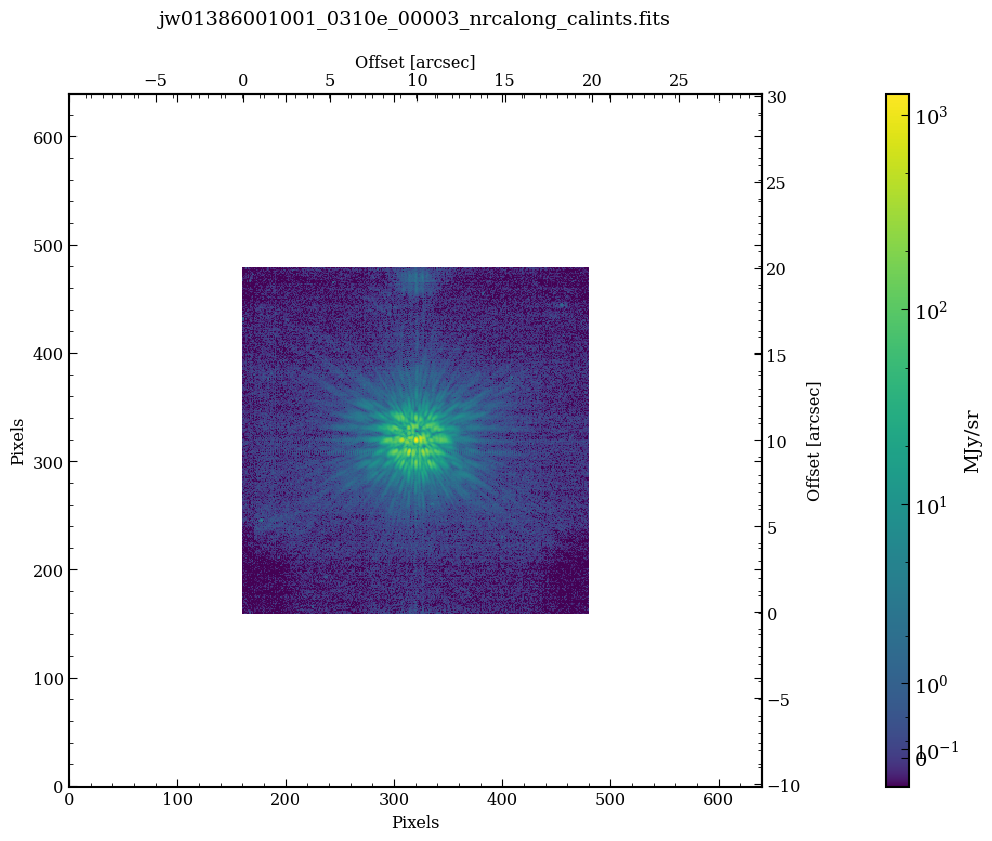

...

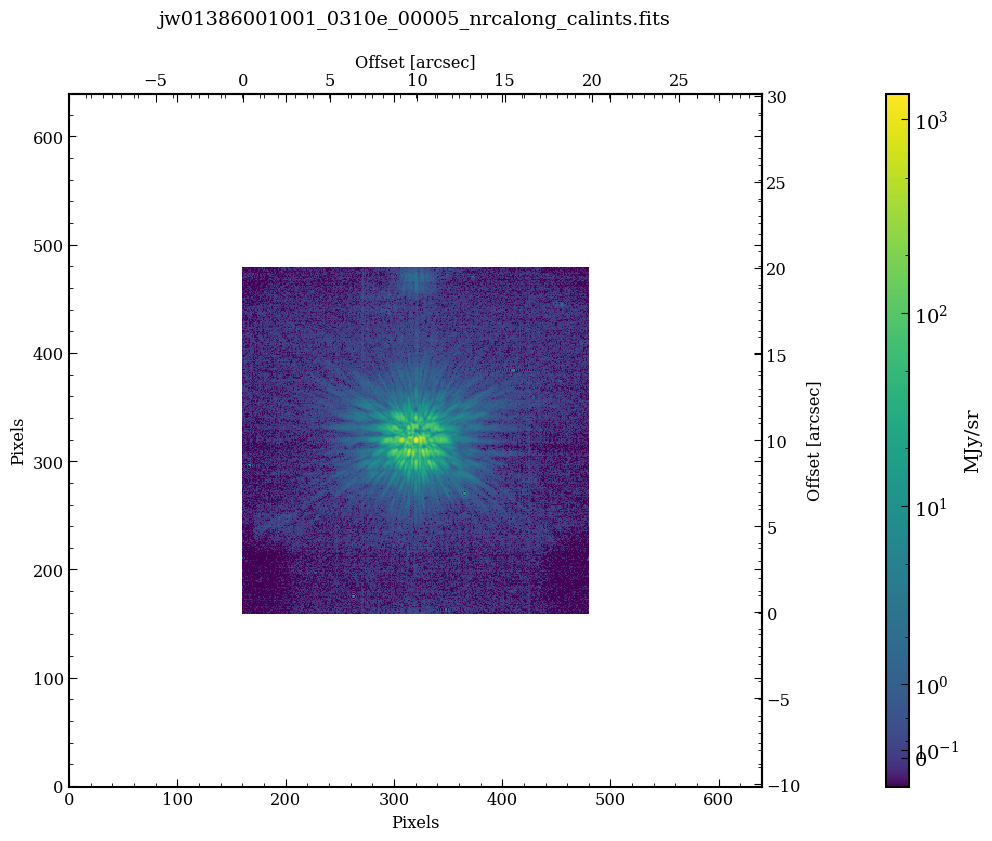

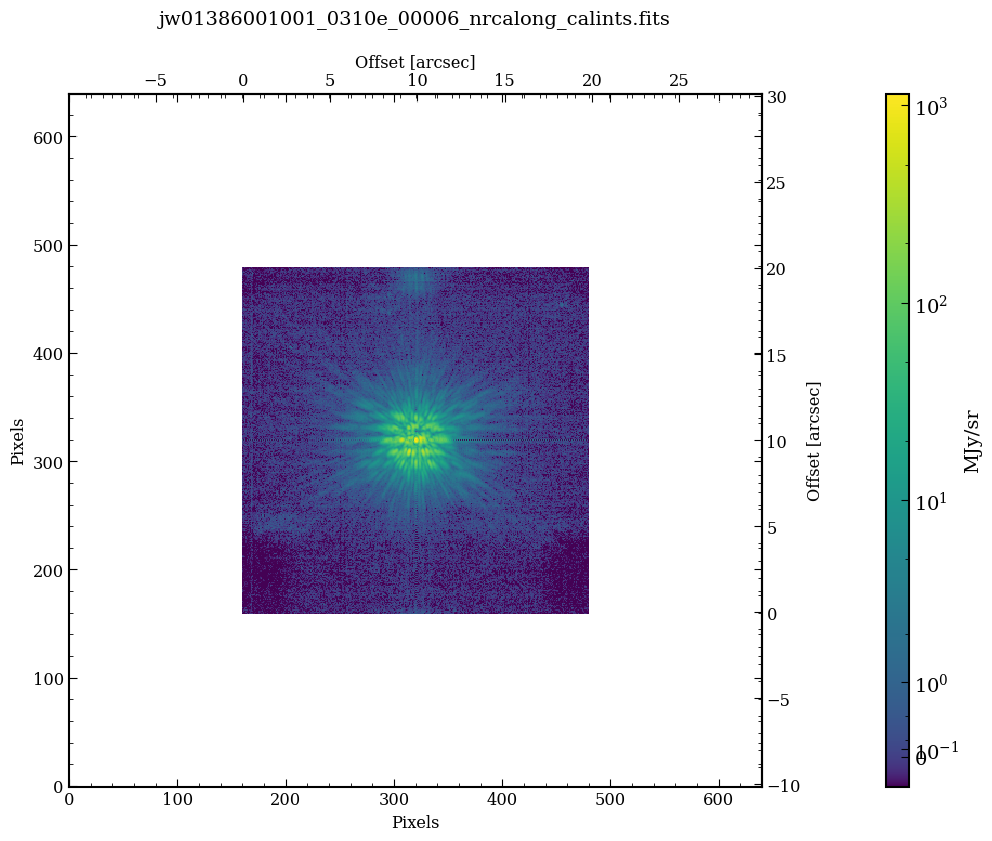

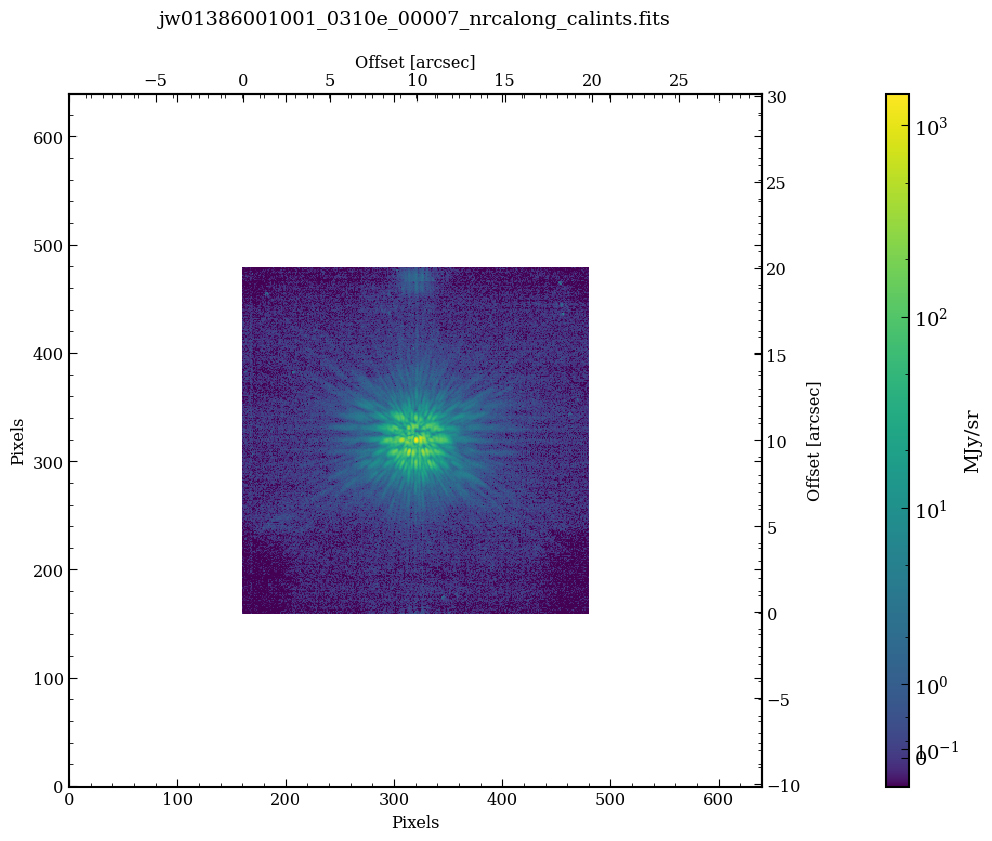

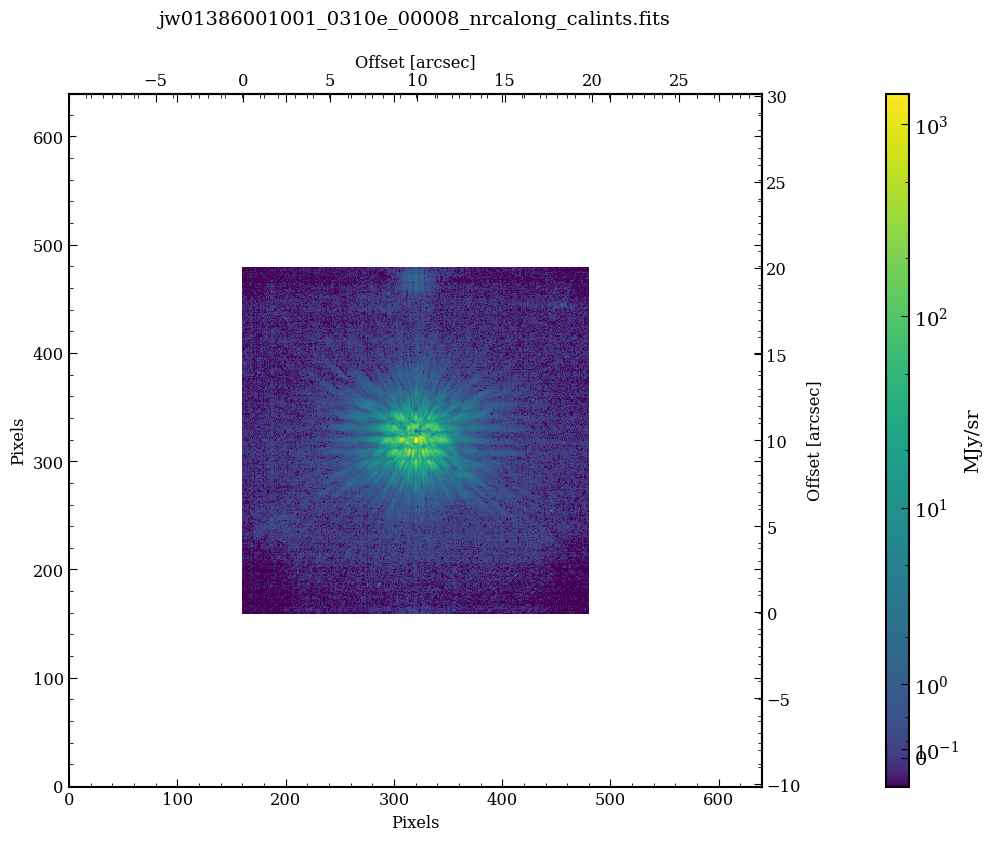

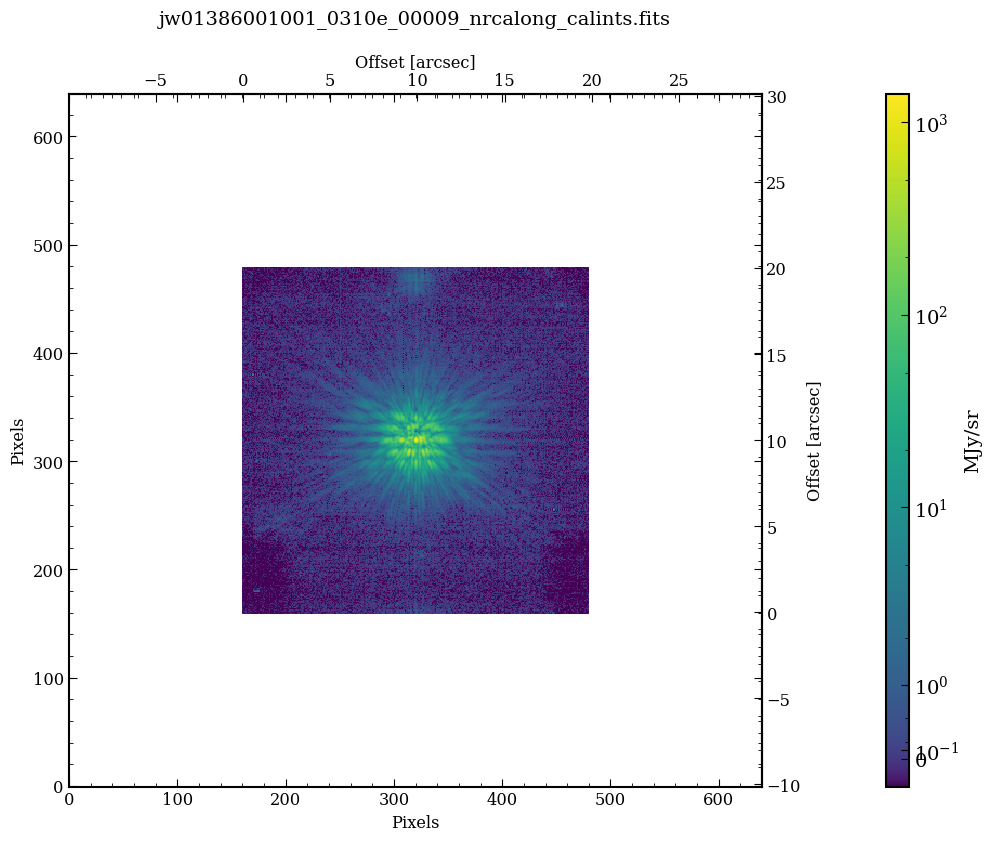

In [17]:
spaceKLIP.plotting.display_coron_dataset(database, 
                                         restrict_to='F444W', save_filename='plots_f444w_stage2_cleaned.pdf')

In [18]:
!open plots_f444w_stage2_cleaned.pdf

# Level 3 reductions: KLIP

## PSF Subtraction: option using pyKLIP

SpaceKLIP supports multiple algorithms for PSF subtraction, including pyKLIP (recommended) as well as the 
 jwst pipeline Coron3Pipeline. Here we use a pyKLIP subtraction. 

In [19]:
# Run pyKLIP pipeline. Additional parameters for klip_dataset function can
# be passed using kwargs parameter.
spaceKLIP.pyklippipeline.run_obs(database=database,
                       kwargs={'mode': ['ADI', 'RDI', 'ADI+RDI'],
                               'annuli': [1, 5],
                               'subsections': [1],
                               'numbasis': [1, 2, 5, 10, 20, 50],
                               'algo': 'klip',
                               'save_rolls': True},
                       subdir='klipsub')


[spaceKLIP.pyklippipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength
Wavelength 2.505e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength
Wavelength 2.505e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength
Wavelength 2.505e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength
Wavelength 2.505e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength
Wavelength 2.505e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength
Wavelength 2.505e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F300M_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength
Wavelength 2.994e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength
Wavelength 2.994e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength
Wavelength 2.994e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength
Wavelength 2.994e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength
Wavelength 2.994e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength
Wavelength 2.994e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F356W_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength
Wavelength 3.593e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength
Wavelength 3.593e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength
Wavelength 3.593e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength
Wavelength 3.593e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength
Wavelength 3.593e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength
Wavelength 3.593e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F410M_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength
Wavelength 4.089e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength
Wavelength 4.089e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength
Wavelength 4.089e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength
Wavelength 4.089e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength
Wavelength 4.089e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength
Wavelength 4.089e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F444W_MASKRND_MASK335R_SUB320A335R
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength
Wavelength 4.439e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength
Wavelength 4.439e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength
Wavelength 4.439e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength
Wavelength 4.439e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength
Wavelength 4.439e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength
Wavelength 4.439e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/docs/source/tutorials/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 480, 480)
[spaceKLIP.database:INFO] --> Identified 5 concatenation(s)
[spaceKLIP.database:INFO]   --> Concatenation 1: JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R
 TYPE   EXP_TYPE DATAMODL TELESCOP  TARGPROP INSTRUME DETECTOR FILTER ...   SUBARRAY   PIXSCALE    MODE  ANNULI SUBSECTS    KLMODES     BUNIT  BLURFWHM
------ --------- -------- -------- --------- -------- -------- ------ ... ----------- ---------- ------- ------ -------- -------------- ------ --------
PYKLIP NRC_CORON   STAGE3     JWST HIP-65426   NIRCAM NRCALONG  F250M ... SUB320A335R 0.06247899     ADI      1        1 1,2,5,10,20,50 MJy/sr      nan
PYKLIP NRC_CORON   STAGE3     JWST HIP-65426   NIRCAM NRCALONG  F250M ... SUB320A335R 0.06247899     ADI      5  

The stage 3 information in the database is added to another table. The stage 2 information remains in the database, which is needed to maintain the information on rolls and references used in the reduction for forward modeling. 
In fact the stage 3 outputs include a JSON file that includes the table of the stage 2 data, so if you read in the stage 3 outputs it also learns about the stage 2 inputs. 

In [20]:
database.summarize()

NIRCAM_F250M_MASK335R
	STAGE2: 11 files;	2 SCI, 9 REF
	STAGE3: 6 files;	6 PYKLIP
NIRCAM_F300M_MASK335R
	STAGE2: 11 files;	2 SCI, 9 REF
	STAGE3: 6 files;	6 PYKLIP
NIRCAM_F356W_MASK335R
	STAGE2: 11 files;	2 SCI, 9 REF
	STAGE3: 6 files;	6 PYKLIP
NIRCAM_F410M_MASK335R
	STAGE2: 11 files;	2 SCI, 9 REF
	STAGE3: 6 files;	6 PYKLIP
NIRCAM_F444W_MASK335R
	STAGE2: 11 files;	2 SCI, 9 REF
	STAGE3: 6 files;	6 PYKLIP


### Optional: Re-read level 3 outputs into database 
This shows how you can start re-analyses at this point, once you have run the previous steps.

Note, to read in level 3 data you must set the `readlevel` parameter to 3. This invokes code for reading the level-3 formatted data products, and also implicitly reads in the metadata about the stage 2 files used as input to stage 3. 

In [4]:
database = spaceKLIP.database.create_database(input_dir = os.path.join(data_root, 'klipsub'),
                                              file_type='*KLmodes-all.fits.fits',
                                              output_dir=data_root,
                                              readlevel=3,
                                              pid=1386)

Found 30 files to read in.
Reading data_nircam_hd65426/klipsub/ADI+RDI_NANNU1_NSUBS1_JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R-KLmodes-all.fits
Reading data_nircam_hd65426/klipsub/ADI+RDI_NANNU1_NSUBS1_JWST_NIRCAM_NRCALONG_F300M_MASKRND_MASK335R_SUB320A335R-KLmodes-all.fits
Reading data_nircam_hd65426/klipsub/ADI+RDI_NANNU1_NSUBS1_JWST_NIRCAM_NRCALONG_F356W_MASKRND_MASK335R_SUB320A335R-KLmodes-all.fits
Reading data_nircam_hd65426/klipsub/ADI+RDI_NANNU1_NSUBS1_JWST_NIRCAM_NRCALONG_F410M_MASKRND_MASK335R_SUB320A335R-KLmodes-all.fits
Reading data_nircam_hd65426/klipsub/ADI+RDI_NANNU1_NSUBS1_JWST_NIRCAM_NRCALONG_F444W_MASKRND_MASK335R_SUB320A335R-KLmodes-all.fits
Reading data_nircam_hd65426/klipsub/ADI+RDI_NANNU5_NSUBS1_JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R-KLmodes-all.fits
Reading data_nircam_hd65426/klipsub/ADI+RDI_NANNU5_NSUBS1_JWST_NIRCAM_NRCALONG_F300M_MASKRND_MASK335R_SUB320A335R-KLmodes-all.fits
Reading data_nircam_hd65426/klipsub/ADI+RDI_NANNU5_NSUBS

 TYPE   EXP_TYPE DATAMODL TELESCOP  TARGPROP INSTRUME DETECTOR FILTER ...   SUBARRAY   PIXSCALE    MODE  ANNULI SUBSECTS    KLMODES     BUNIT  BLURFWHM
------ --------- -------- -------- --------- -------- -------- ------ ... ----------- ---------- ------- ------ -------- -------------- ------ --------
PYKLIP NRC_CORON   STAGE3     JWST HIP-65426   NIRCAM NRCALONG  F444W ... SUB320A335R 0.06247899 ADI+RDI      1        1 1,2,5,10,20,50 MJy/sr      nan
PYKLIP NRC_CORON   STAGE3     JWST HIP-65426   NIRCAM NRCALONG  F444W ... SUB320A335R 0.06247899 ADI+RDI      5        1 1,2,5,10,20,50 MJy/sr      nan
PYKLIP NRC_CORON   STAGE3     JWST HIP-65426   NIRCAM NRCALONG  F444W ... SUB320A335R 0.06247899     ADI      1        1 1,2,5,10,20,50 MJy/sr      nan
PYKLIP NRC_CORON   STAGE3     JWST HIP-65426   NIRCAM NRCALONG  F444W ... SUB320A335R 0.06247899     ADI      5        1 1,2,5,10,20,50 MJy/sr      nan
PYKLIP NRC_CORON   STAGE3     JWST HIP-65426   NIRCAM NRCALONG  F444W ... SUB320A335R 0.

In [5]:
database.summarize()

NIRCAM_F250M_MASK335R
	STAGE2: 11 files;	2 SCI, 9 REF
	STAGE3: 6 files;	6 PYKLIP
NIRCAM_F300M_MASK335R
	STAGE2: 11 files;	2 SCI, 9 REF
	STAGE3: 6 files;	6 PYKLIP
NIRCAM_F356W_MASK335R
	STAGE2: 11 files;	2 SCI, 9 REF
	STAGE3: 6 files;	6 PYKLIP
NIRCAM_F410M_MASK335R
	STAGE2: 11 files;	2 SCI, 9 REF
	STAGE3: 6 files;	6 PYKLIP
NIRCAM_F444W_MASK335R
	STAGE2: 11 files;	2 SCI, 9 REF
	STAGE3: 6 files;	6 PYKLIP


Note that both the L2 and L3 files are loaded automatically after calling `read_jwst_s3_data`. This allows steps using or modeling the L3 data to have access to all the metadata about the individual exposures and orientations and PSFs that went into the L3 reductions. 

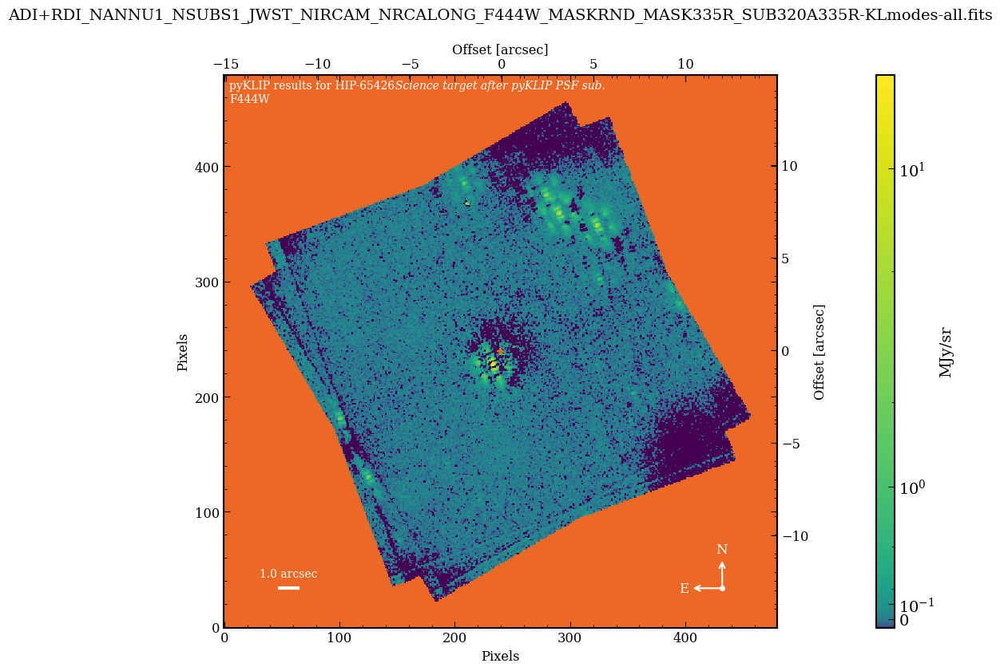

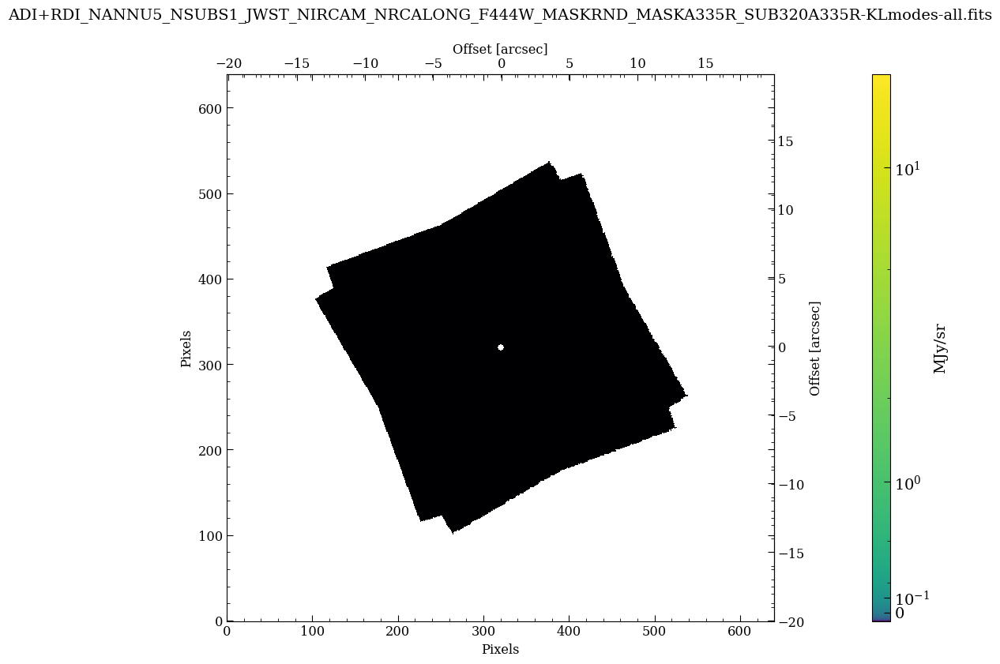

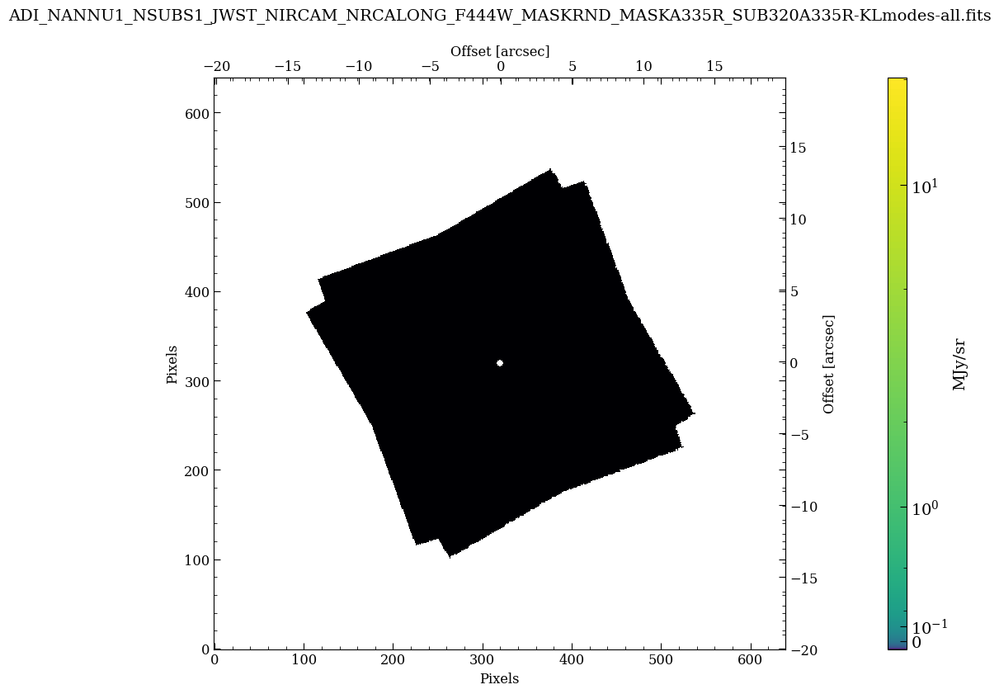

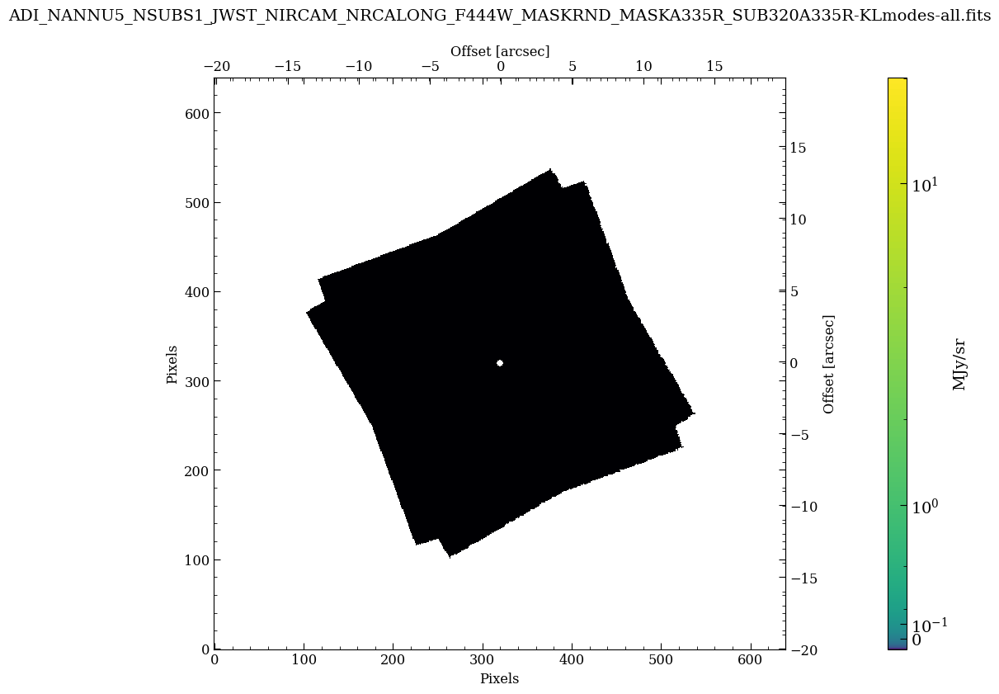

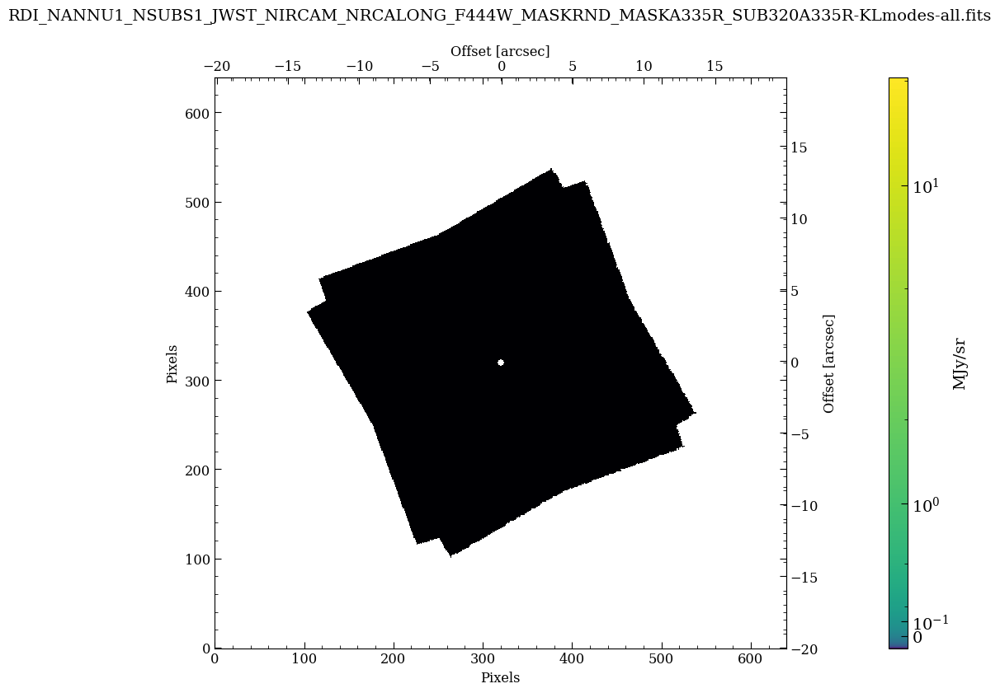

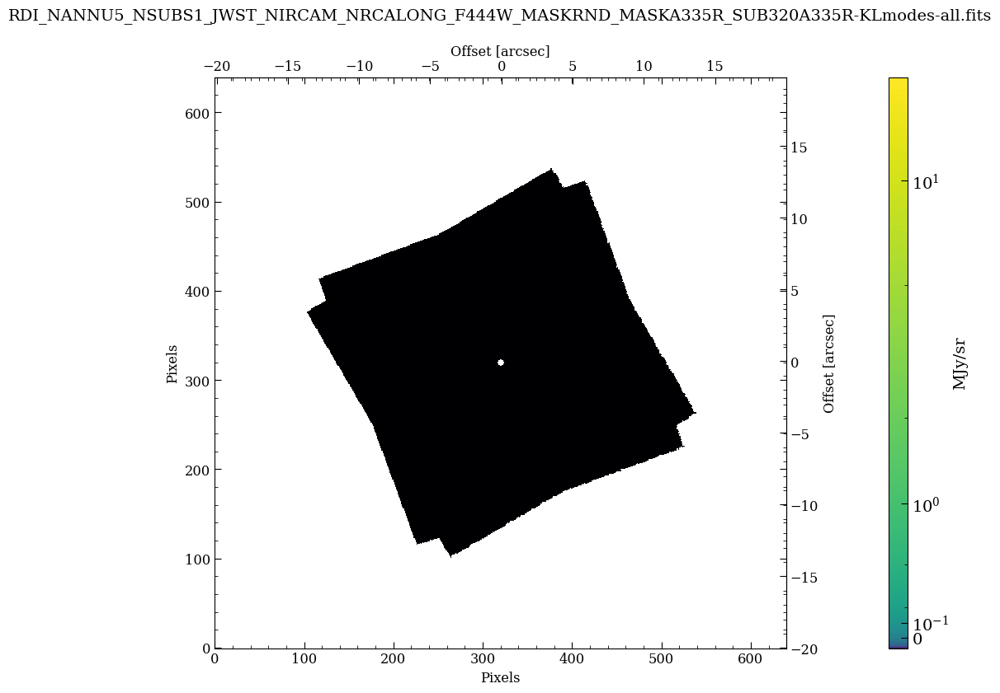

In [6]:
spaceKLIP.plotting.display_coron_dataset(database, 
                                         restrict_to='F444W', save_filename='plots_f444w_pyklip.pdf')

## PSF Subtraction: option using classical PSF subtraction

In some cases, simple classical PSF subtraction is a robust and effective approach. 

We also demonstrate here the ``save_rolls`` parameter, which causes the PSF-subtracted versions of each individual science roll to also be saved, in addition to the roll-combined final product. 

<font color='red'>TODO: debug the following...</font>

In [40]:
spaceKLIP.classpsfsubpipeline.run_obs(database, 
                                      subdir='classical',
                                      kwargs = {'save_rolls': True})

[spaceKLIP.classpsfsubpipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASK335R_SUB320A335R


AttributeError: 'NoneType' object has no attribute 'shape'